# Driving Business Through Analytics
## Procter & Gamble
### Swiffer Customer Interpretable Clustering
#### Giacomo Miolo - 23rd April 2020

## Importing Libraries, Dataset and Helper Functions

In [1]:
import pandas as pd
import numpy as np

# Visualizations
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as px
import matplotlib.cm as cm

# Missing Values
import missingno as msno

# Stats
from scipy.stats import skew, kurtosis

# Dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Clustering Algorithms
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.spatial.distance import pdist, squareform

from sklearn.metrics import silhouette_samples, silhouette_score, calinski_harabasz_score

In [2]:
PATH = "/Users/giacomomiolo/Downloads/I__BABD4_Driving_Business_Actions_Through_Analytcs_elective_course_info/Knime/Exercises/Data/"
df = pd.read_csv(PATH + "ConsumerDataset.csv")
sales = pd.read_csv(PATH + "SalesDataset.csv")
cons_new = pd.read_csv(PATH + "ConsumerDataset_New.csv")

In [3]:
def describe_cat(df, col):
    
    '''Takes as input a dataframe and the name of the column you want to describe.
    Returns the unique values, eventual missing values count,
    the absolute frequencies and the relative frequencies of unique values.
    
    Args:
        df (pandas.core.frame.DataFrame): Pandas DataFrame object.
        col (str): Name of the column to describe.'''
    
    # Number, count and percentage of unique values in the column
    print(f'{col} - {df[col].nunique()} unique values.')
    count = df[col].value_counts(sort=True, dropna=True)
    perc = df[col].value_counts(normalize=True, sort=True, ascending=False, dropna=True)*100
    d = pd.concat([perc, count], axis=1, keys=['Percentage %', 'Count'])
    
    # dtype of the column
    print(f"dtype: {df[col].dtype}.")
    
    # Number of missing values, if any
    missing_count = df[col].isnull().sum()
    if missing_count != 0:
        total = len(df[col])
        missing_perc = (missing_count/total)*100
        
        print(f'! Missing values: perc - {missing_perc:0.3f}% count - {missing_count}')
    else:
        print(f'No missing values.\n')
    

    return print(f"{d}\n")

def n_outl(df, col_name, method='norm', n_std=2, detect=False):
    '''
    df (pandas.core.frame.DataFrame): Dataframe.
    col_name (str): Numeric column to be consider.
    method (str, optional): Accepts 'IQR' for interquartile range, defaults to Normal Distribution.
    n_std (int, optional): Number of standard deviations to consider, defaults to 2.
    '''
    if method.lower()=='norm':
        mean = df[col_name].mean()
        sd = df[col_name].std()
        
        # keep only the ones that are within +x to -x standard deviations in the column
        boolean_mask = (np.abs(df[col_name].values - mean) > n_std*sd)
        

    elif method.lower()=='iqr':
    
        q1 = np.quantile(df[col_name], 0.25)
        q3 = np.quantile(df[col_name], 0.75)
        iqr = q3-q1
        th1 = q1 - 1.5*iqr
        th3 = q3 + 1.5*iqr

        boolean_mask = ( (df[col_name] > th3) | (df[col_name] < th1) ) 
    
    
    if detect:
        df_outliers = df[boolean_mask]
        return df_outliers

    outliers = len(df[boolean_mask])
    return outliers

def ranges(input_df, col, name, tuples, last):
    '''
    Creates a new column with labels of the corresponding range
    
    Args:
        input_df (pandas.core.frame.DataFrame): Dataframe to modify.
        col (str): Column with numeric values to use to create ranges.
        name (str): Name of the column to be created with the labels.
        tuples (list): List of tuples with values and labels. Ex. [(100, 'Low'), (400, 'Medium')]
    '''
    df = input_df.copy()
    counter = 0
    df[name] = last
    df['Order'] = len(tuples)+1
    for i in range(len(tuples)):
        if i == 0:
            #print(f"{tuples[i][0]} - {tuples[i][1]}")
            df.loc[df[col] < tuples[i][0], name] = tuples[i][1]
            df.loc[df[col] < tuples[i][0], 'Order'] = i
        else:
            #print(f"{tuples[i][0]} - {tuples[i][1]}")
            df.loc[(df[col] >= tuples[i-1][0]) & (df[col] < tuples[i][0]), name] = tuples[i][1]
            df.loc[(df[col] >= tuples[i-1][0]) & (df[col] < tuples[i][0]), 'Order'] = i
    return df

def get_stats(df, group, inputs, order=False, outlier=True, n_std=2):
    '''
    df (pandas.core.frame.DataFrame): Dataframe containing all the columns of interest.
    group (str): Name of the column for which to group by.
    inputs (str, list): If list (max 2 elements), first element is the part, the second is the total.
    order(bool, optional): If there is a column to consider for ordering.
    outlier (bool, optional): Defaults to True, detects outliers.
    n_std (int, optional): Defaults to 2, number of standard deviations to classify outliers.
    '''

    if type(inputs) == list:
    	# Total
        col_tot = inputs[1]
        str_tot = col_tot.split("_")[-1]
        # Part
        col_stats = inputs[0]
        str_stats = col_stats.split("_")[-1]
    elif type(inputs) == str:
        col_stats = inputs
        str_stats = col_stats.split("_")[-1]

    stats = pd.DataFrame()
    stats['Percentage'] = np.round(df[group].value_counts(normalize = True, sort = True, ascending=False, dropna=True)*100, 2)
    stats['Count'] = df[group].value_counts(sort=True, dropna=True)
    stats.reset_index(inplace=True)
    stats.rename(columns={'index': group}, inplace=True)
    stats = stats.merge(df.groupby(group, as_index=False)[col_stats].min().rename(columns={col_stats: 'Income_Min'}), on=group)
    stats = stats.merge(df.groupby(group, as_index=False)[col_stats].mean().rename(columns={col_stats: 'Income_Average'}), on=group)
    stats = stats.merge(df.groupby(group, as_index=False)[col_stats].median().rename(columns={col_stats: 'Income_Median'}), on=group)
    stats = stats.merge(df.groupby(group, as_index=False)[col_stats].max().rename(columns={col_stats: 'Income_Max'}), on=group)
    stats = stats.merge(df.groupby(group, as_index=False)[col_stats].sum().rename(columns={col_stats: 'Income_Total'}), on=group)
    
   

    if outlier:
        d = {}
        for i in [*stats[group]]:
            this_mask = df[group] == i
            n = n_outl(df[this_mask], col_stats, n_std=n_std)
            d[i] = n
        
        d_df = pd.DataFrame.from_dict(d, orient='index')
        d_df.reset_index(inplace=True)
        d_df.columns = [group, 'Outlier_Count']
        stats = stats.merge(d_df, on=group)
        stats['Outlier_Perc'] = np.round(stats['Outlier_Count'] / stats['Count'] * 100, 2)

    if order:
        # Ordering
        stats = stats.merge(df.loc[:,[group, 'Order']].drop_duplicates(), on=group).sort_values('Order', ascending=True)
        stats.set_index('Order', inplace=True)
        stats.index.rename('', inplace=True)
    
    # Formatting
    
    stats['Income_Min'] = stats['Income_Min'].astype(int)
    stats['Income_Average'] = stats['Income_Average'].astype(int)
    stats['Income_Median'] = stats['Income_Median'].astype(int)
    stats['Income_Max'] = stats['Income_Max'].astype(int)
    stats['Income_Total'] = stats['Income_Total'].astype(int)
    
    return stats

In [4]:
print(df.shape)
df.head()

(1999, 13)


,ID,Country,Annual income (k$),Gender,Birth year,Is Parent,Purchase amount,Purchase frequency,# of different purchased product,Is earlier adopter,Preferred purchase channel,Has been reached by marketing,Best coupon type
0,1,USA,16.9,M,1999,False,0.292497,0.347419,0.323232,False,app (mobile),True,holidays
1,2,Italy,50.5,M,1964,True,0.757364,0.177353,0.505051,False,large store,True,holidays
2,3,USA,28.2,F,1999,False,0.266436,0.332183,0.252525,False,app (mobile),False,NaN
3,4,USA,86.8,M,1958,True,0.887011,0.613946,0.878788,True,small store,True,new product
4,5,Germany,30.5,F,1972,True,0.157081,0.727470,0.707071,True,large store,True,new product


* \# of different purchased product: if 1 represents all the Swiffer products so 0.5 means that the customer has bought half of them during his/her life.

* Preferred purchase channel vs. Has been reached by marketing
* By Japan/Canada/Belgium

In [5]:
df.drop('ID', axis=1, inplace=True)

In [6]:
cat = df[['Country', 'Gender', 'Is Parent', 'Is earlier adopter', 'Preferred purchase channel', 'Has been reached by marketing', 'Best coupon type']]
num = df[['Annual income (k$)', 'Birth year', 'Purchase amount', 'Purchase frequency', '# of different purchased product']]

# Exploratory Data Analysis

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1999 entries, 0 to 1998
Data columns (total 12 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Country                           1999 non-null   object 
 1   Annual income (k$)                1999 non-null   float64
 2   Gender                            1999 non-null   object 
 3   Birth year                        1999 non-null   int64  
 4   Is Parent                         1999 non-null   bool   
 5   Purchase amount                   1999 non-null   float64
 6   Purchase frequency                1999 non-null   float64
 7   # of different purchased product  1999 non-null   float64
 8   Is earlier adopter                1999 non-null   bool   
 9   Preferred purchase channel        1999 non-null   object 
 10  Has been reached by marketing     1999 non-null   bool   
 11  Best coupon type                  1582 non-null   object 
dtypes: boo

### Missing Values

In [8]:
for i in df.columns:
    missing_count = df[i].isnull().sum()
    total = len(df[i])
    missing_perc = (missing_count/total)*100
    if missing_count != 0:
        print(f"{i} has {missing_count} missing values, {missing_perc:0.2f} % missing.")

Best coupon type has 417 missing values, 20.86 % missing.


In [9]:
describe_cat(df, 'Best coupon type')

Best coupon type - 5 unique values.
dtype: object.
! Missing values: perc - 20.860% count - 417
                              Percentage %  Count
special season                   39.254109    621
holidays                         35.714286    565
new product                      21.428571    339
certain amount                    3.413401     54
promotional event invitation      0.189633      3



* We can see that there is no label for customers who did not have a best coupon type. Assigning the label '**no coupon**' to missing values.

In [10]:
df['Best coupon type'].replace(to_replace=np.nan, value='no coupon', inplace=True)

In [11]:
describe_cat(df, 'Best coupon type')

Best coupon type - 6 unique values.
dtype: object.
No missing values.

                              Percentage %  Count
special season                   31.065533    621
holidays                         28.264132    565
no coupon                        20.860430    417
new product                      16.958479    339
certain amount                    2.701351     54
promotional event invitation      0.150075      3



### Duplicate Values

In [12]:
duplicated_mask = df.duplicated()
print(f"There are {df[duplicated_mask].shape[0]} duplicates values.")

There are 0 duplicates values.


### Numerical Features

#### Basic Statistics

In [13]:
def describe_num(df, col_name):
    print(f"{col_name}")
    print(f"Minimum: {df[col_name].min()}")
    print(f"Mean: {np.round(df[col_name].mean(),2)}")
    print(f"Median: {df[col_name].median()}")
    print(f"Max: {df[col_name].max()}")
    print(f"Standard Deviation: {np.round(df[col_name].std(),2)}\n")
    
for i in num.columns:
    describe_num(num, i)

Annual income (k$)
Minimum: 10.0
Mean: 51.86
Median: 50.6
Max: 100.0
Standard Deviation: 25.12

Birth year
Minimum: 1950
Mean: 1975.63
Median: 1976.0
Max: 2001
Standard Deviation: 14.85

Purchase amount
Minimum: 0.0
Mean: 0.52
Median: 0.508523816
Max: 1.0
Standard Deviation: 0.23

Purchase frequency
Minimum: 0.0
Mean: 0.45
Median: 0.45182535799999995
Max: 1.0
Standard Deviation: 0.22

# of different purchased product
Minimum: 0.0
Mean: 0.54
Median: 0.565656566
Max: 1.0
Standard Deviation: 0.27



#### Distributions

Annual income (k$)
Skewness: 0.180, Kurtosis: -1.084


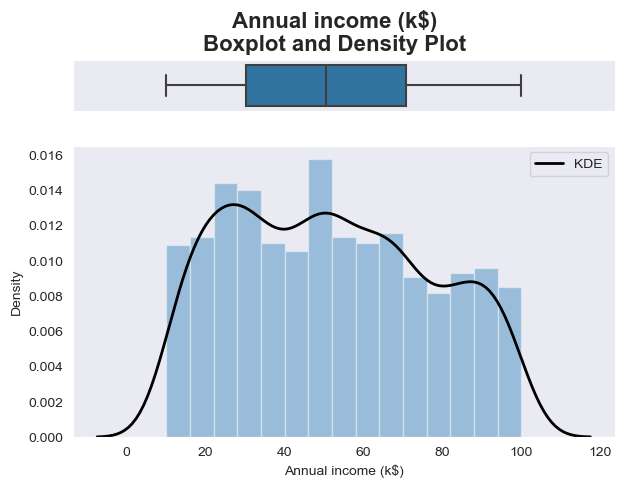

Birth year
Skewness: 0.002, Kurtosis: -1.191


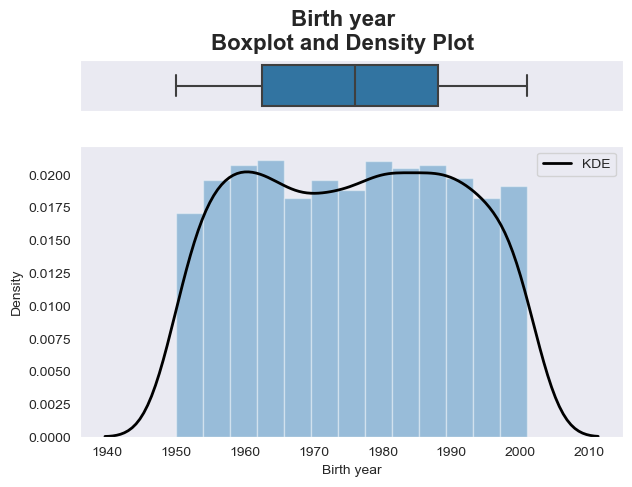

Purchase amount
Skewness: 0.017, Kurtosis: -1.474


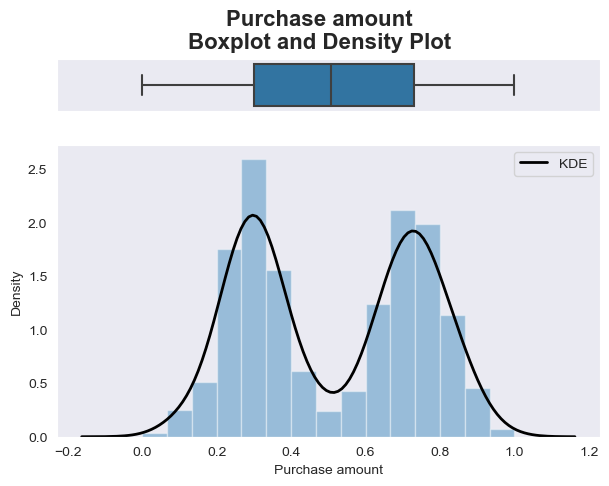

Purchase frequency
Skewness: 0.024, Kurtosis: -1.482


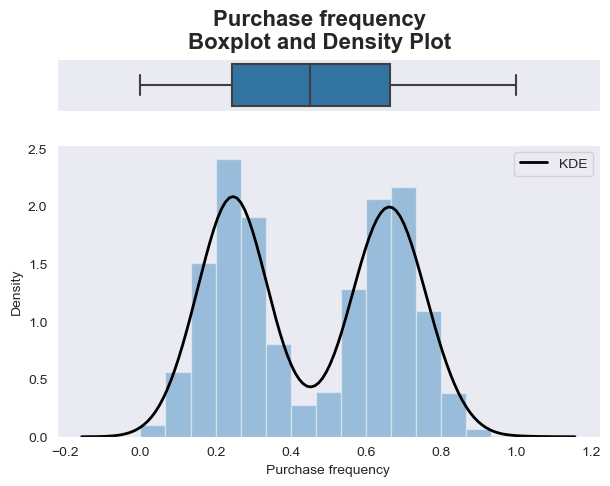

# of different purchased product
Skewness: -0.193, Kurtosis: -0.888


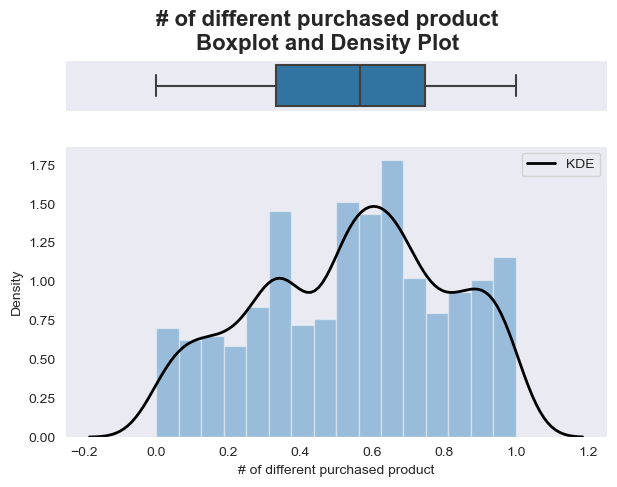

In [14]:
sns.set_style("dark")


for i in num.columns:
    fig, axes = plt.subplots(2, sharex=True, figsize=(7, 5), dpi=100, gridspec_kw={"height_ratios": (.15, .85)})
    fig.suptitle(f'{i}\nBoxplot and Density Plot', fontweight='bold', fontsize=16)
    sns.boxplot(num[i], ax=axes[0])
    axes[0].set_title('')
    axes[0].set_xlabel('')
    axes[0].set_ylabel('')
    sns.distplot(num[i],
                 kde_kws={"color": "black", "lw": 2, "label": "KDE"},
                 hist_kws={"histtype": "bar", "linewidth": 1, "alpha": 0.4},
                 ax=axes[1])
   # axes[1].set_title('')
    axes[1].set_xlabel(f'{i}')
    axes[1].set_ylabel('Density')
    print(f"{i}\nSkewness: {skew(num[i]):0.3f}, Kurtosis: {kurtosis(num[i]):0.3f}")
    plt.show()



#### Correlation

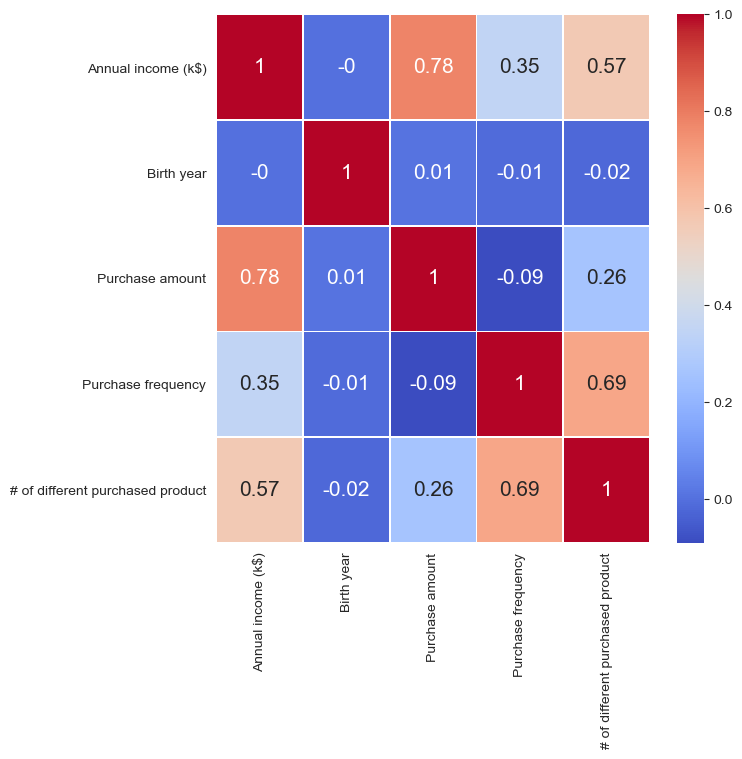

In [15]:
plt.figure(figsize = (7,7), dpi=100)
sns.heatmap(data=num.corr().round(2), cmap='coolwarm', linewidths=.5, annot=True, annot_kws={"size":15})
plt.show()

### Categorical Features

#### Description

In [16]:
for i in cat.columns:
    describe_cat(df, i)

Country - 9 unique values.
dtype: object.
No missing values.

         Percentage %  Count
USA         35.917959    718
Japan       16.358179    327
Italy        9.054527    181
France       8.604302    172
Spain        8.504252    170
Germany      8.404202    168
UK           7.553777    151
Canada       3.301651     66
Belgium      2.301151     46

Gender - 2 unique values.
dtype: object.
No missing values.

   Percentage %  Count
F     52.126063   1042
M     47.873937    957

Is Parent - 2 unique values.
dtype: bool.
No missing values.

       Percentage %  Count
True      66.333167   1326
False     33.666833    673

Is earlier adopter - 2 unique values.
dtype: bool.
No missing values.

       Percentage %  Count
False     78.889445   1577
True      21.110555    422

Preferred purchase channel - 7 unique values.
dtype: object.
No missing values.

                                    Percentage %  Count
large store                            25.862931    517
small store               

### Pairplots

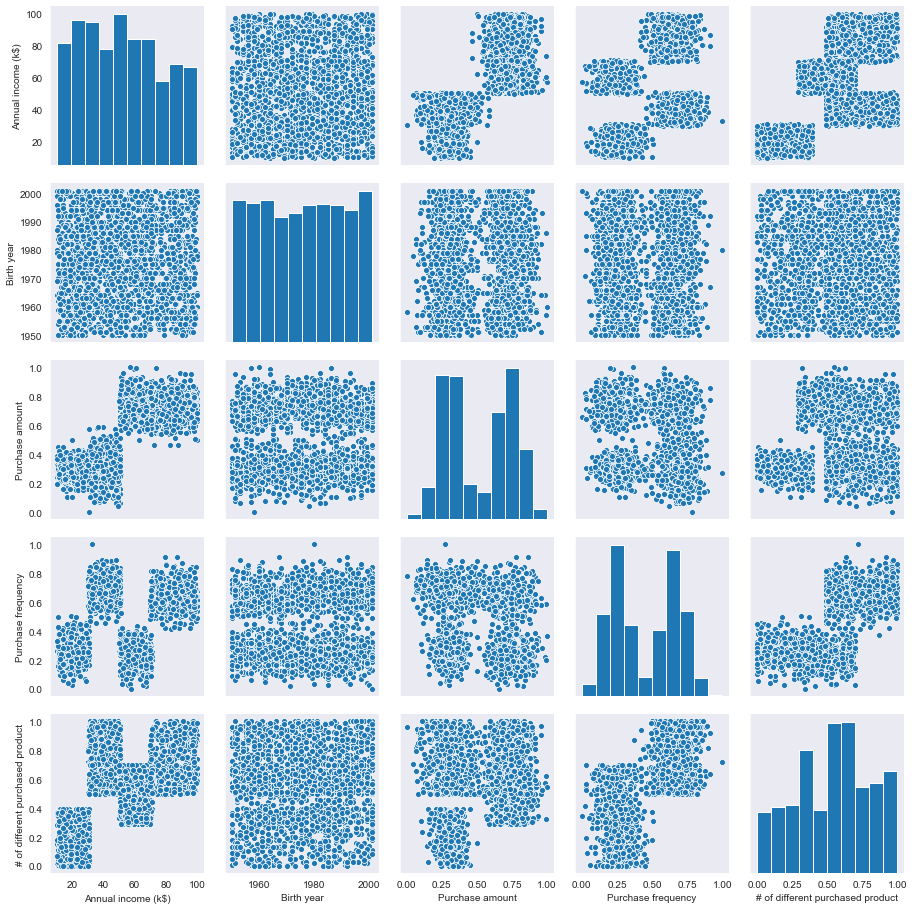

In [17]:
sns.pairplot(df, vars=['Annual income (k$)', 'Birth year', 'Purchase amount',
       'Purchase frequency', '# of different purchased product'], corner=False)
plt.show()

##### Numerical Variables vs. Gender

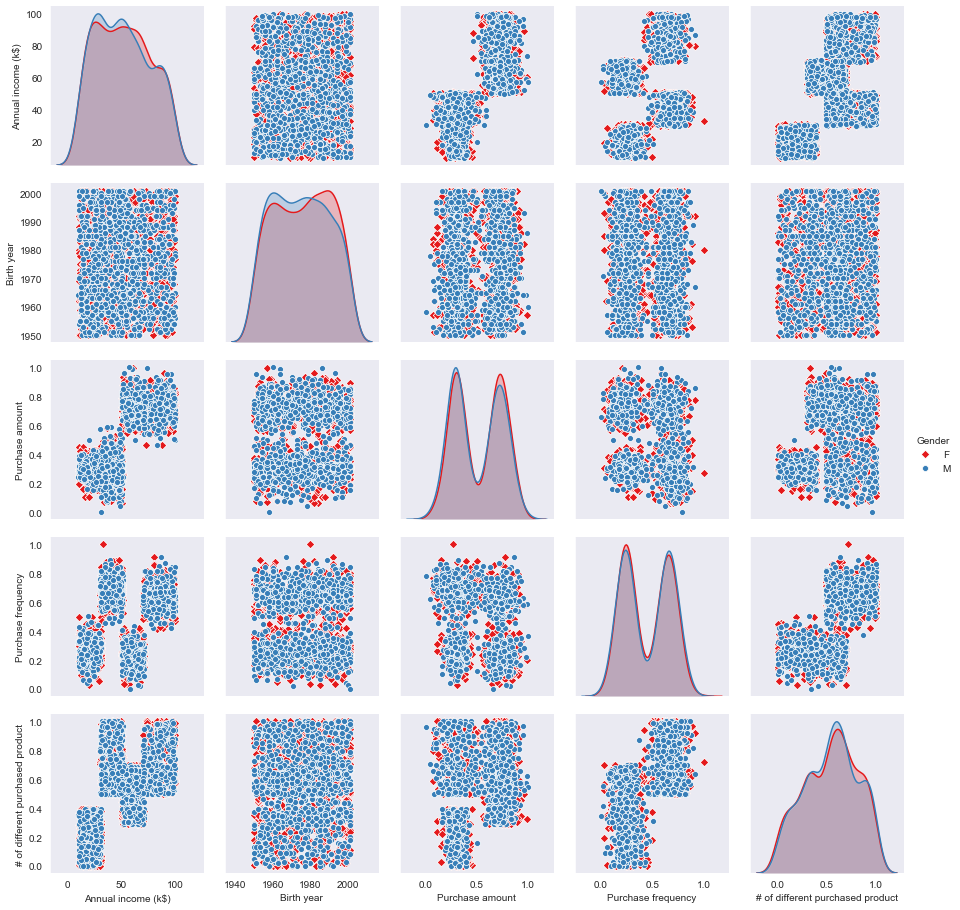

In [18]:
sns.set_palette('Set1')
sns.pairplot(df, vars=['Annual income (k$)', 'Birth year', 'Purchase amount',
       'Purchase frequency', '# of different purchased product'], hue="Gender", hue_order=['F', 'M'], corner=False, markers=["D", "o"])
plt.show()

* We can see that there are no significant differences due to gender.

##### Numerical Variables vs. Is Parent

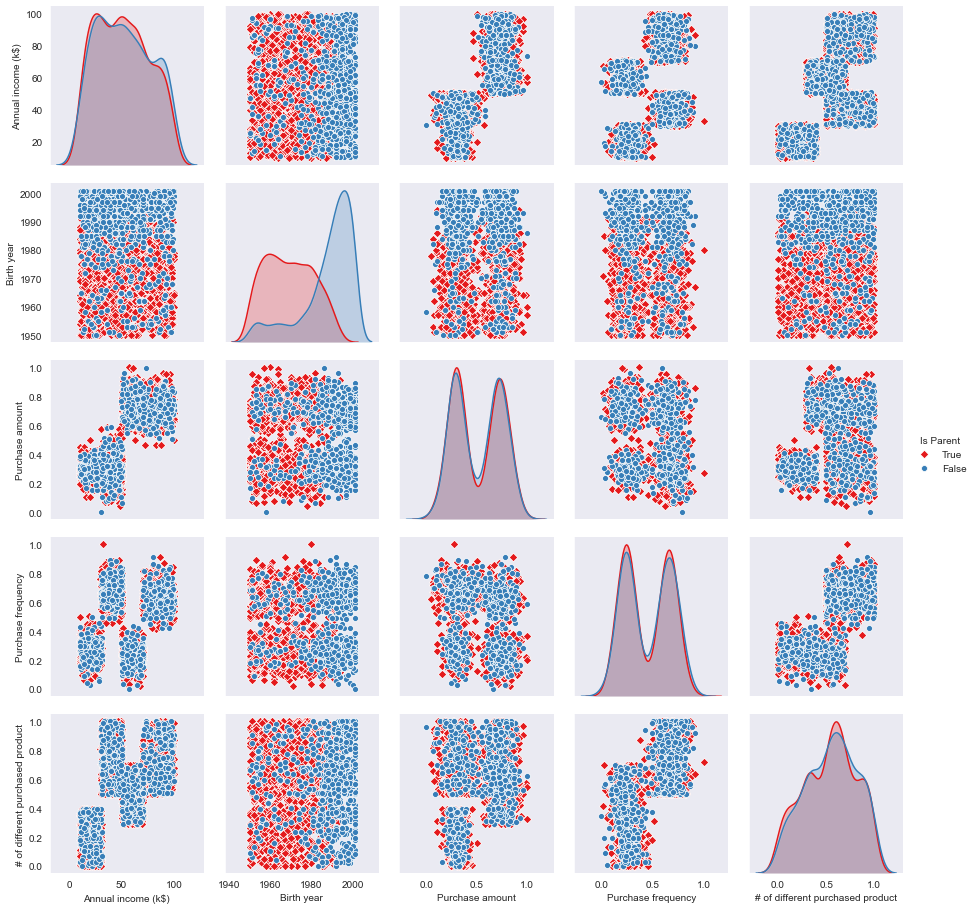

In [19]:
sns.pairplot(df, vars=['Annual income (k$)', 'Birth year', 'Purchase amount',
       'Purchase frequency', '# of different purchased product'], hue="Is Parent", hue_order=[True, False], corner=False, markers=["D", "o"])
plt.show()

* As expected we can see that younger people aren't parents. Not many other significant differences.

##### Numerical Variables vs. Is earlier adopter

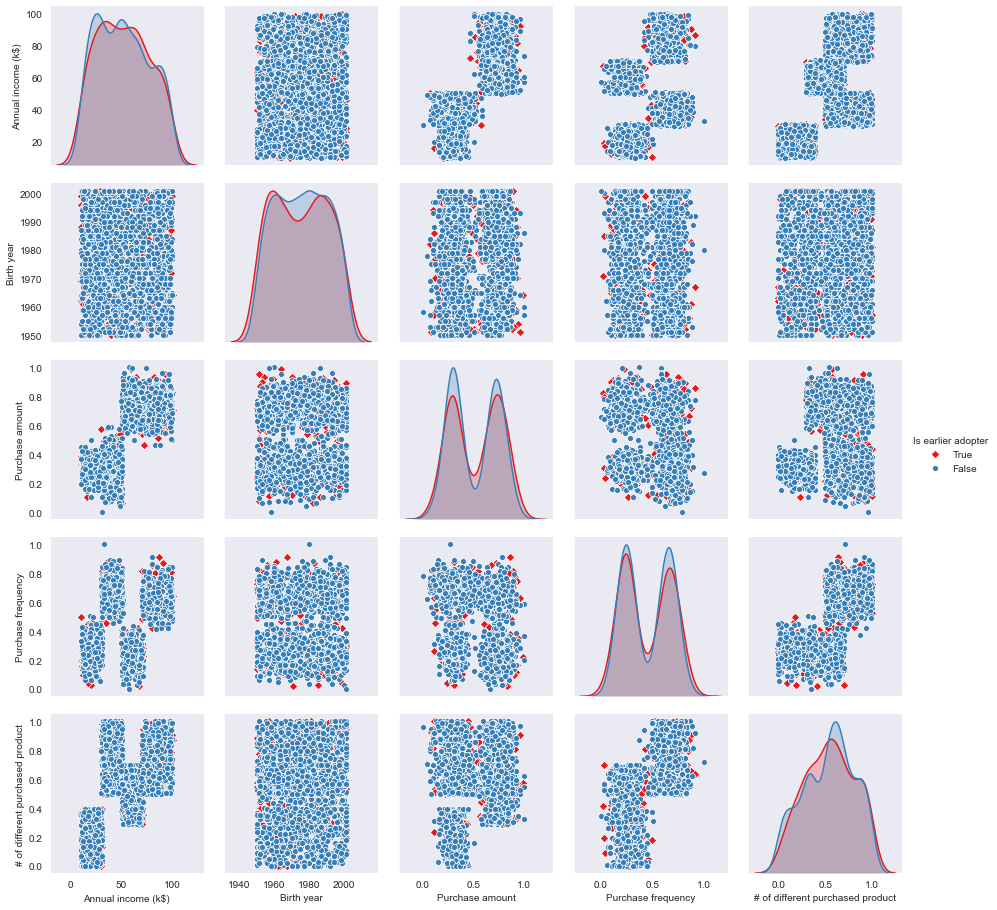

In [20]:
sns.pairplot(df, vars=['Annual income (k$)', 'Birth year', 'Purchase amount',
       'Purchase frequency', '# of different purchased product'], hue="Is earlier adopter", hue_order=[True, False], corner=False, markers=["D", "o"])
plt.show()

* Again, no significant differences.

#### Numerical Variables vs. Has been reached by marketing

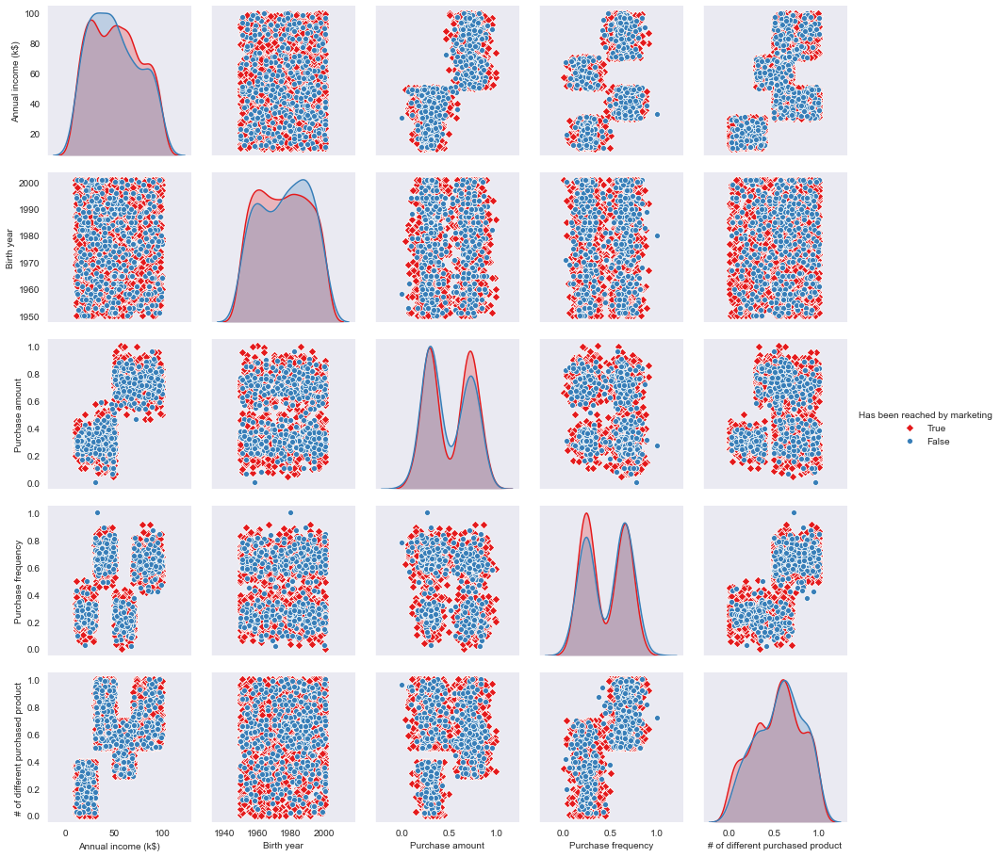

In [21]:
sns.pairplot(df, vars=['Annual income (k$)', 'Birth year', 'Purchase amount',
       'Purchase frequency', '# of different purchased product'], hue="Has been reached by marketing", hue_order=[True, False], corner=False, markers=["D", "o"])
plt.show()

* Not much to comment here as well, doesn't distinguish well.

#### Numerical Features vs. Preferred purchase channel

* Here we group some of the categories together, to see if there are differences between physical stores, online desktop and mobile phone.

In [22]:
describe_cat(df, 'Preferred purchase channel')

Preferred purchase channel - 7 unique values.
dtype: object.
No missing values.

                                    Percentage %  Count
large store                            25.862931    517
small store                            24.162081    483
other online marketplace (desktop)     17.308654    346
official web store (desktop)           17.208604    344
app (mobile)                            6.153077    123
official web store (mobile)             5.202601    104
other online marketplace (mobile)       4.102051     82



In [23]:
df['Preferred purchase channel'].replace(to_replace=['official web store (desktop)', 'official web store (desktop)', 'other online marketplace (desktop)'], value='online desktop', inplace=True)
df['Preferred purchase channel'].replace(to_replace=['app (mobile)', 'official web store (mobile)', 'other online marketplace (mobile)'], value='online mobile', inplace=True)
describe_cat(df, 'Preferred purchase channel')

Preferred purchase channel - 4 unique values.
dtype: object.
No missing values.

                Percentage %  Count
online desktop     34.517259    690
large store        25.862931    517
small store        24.162081    483
online mobile      15.457729    309



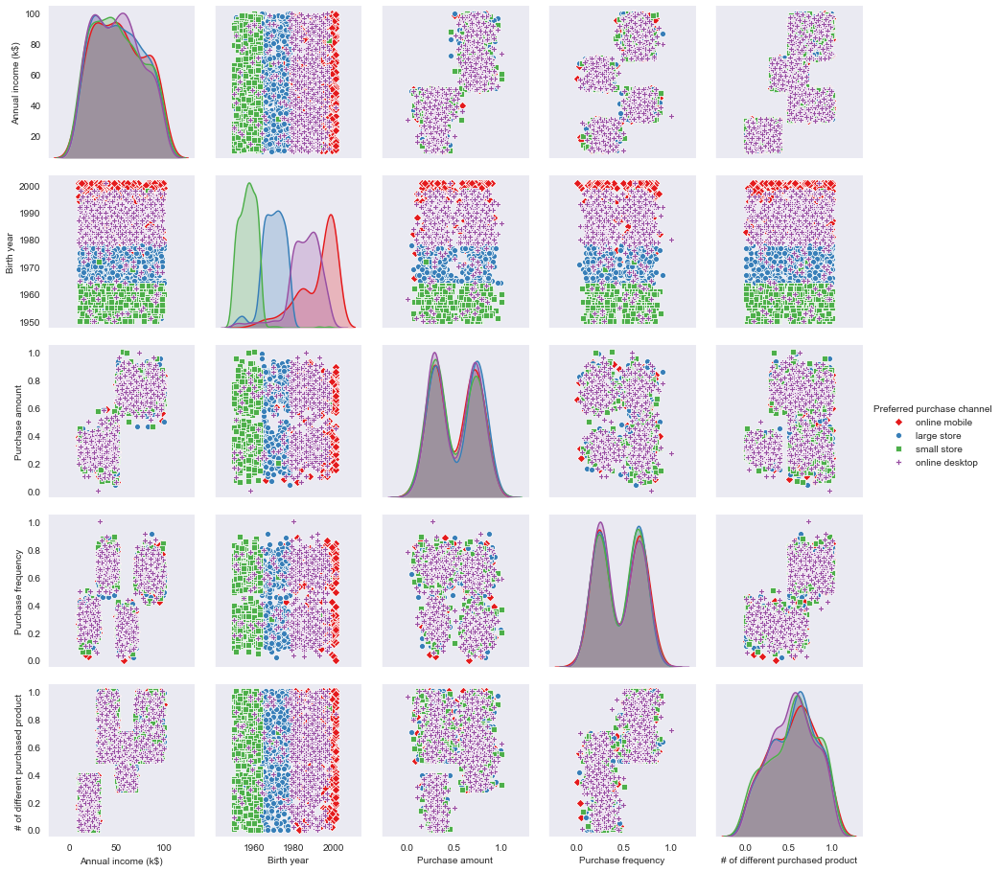

In [24]:
sns.pairplot(df, vars=['Annual income (k$)', 'Birth year', 'Purchase amount',
       'Purchase frequency', '# of different purchased product'], hue="Preferred purchase channel", corner=False, markers=["D", "o", "s", "P"])
plt.show()

* We can see that different age ranges clearly prefer different purchase channels. Older peopler prefer physical locations, younger people prefer online shopping.

#### Numerical Features vs. Best coupon type

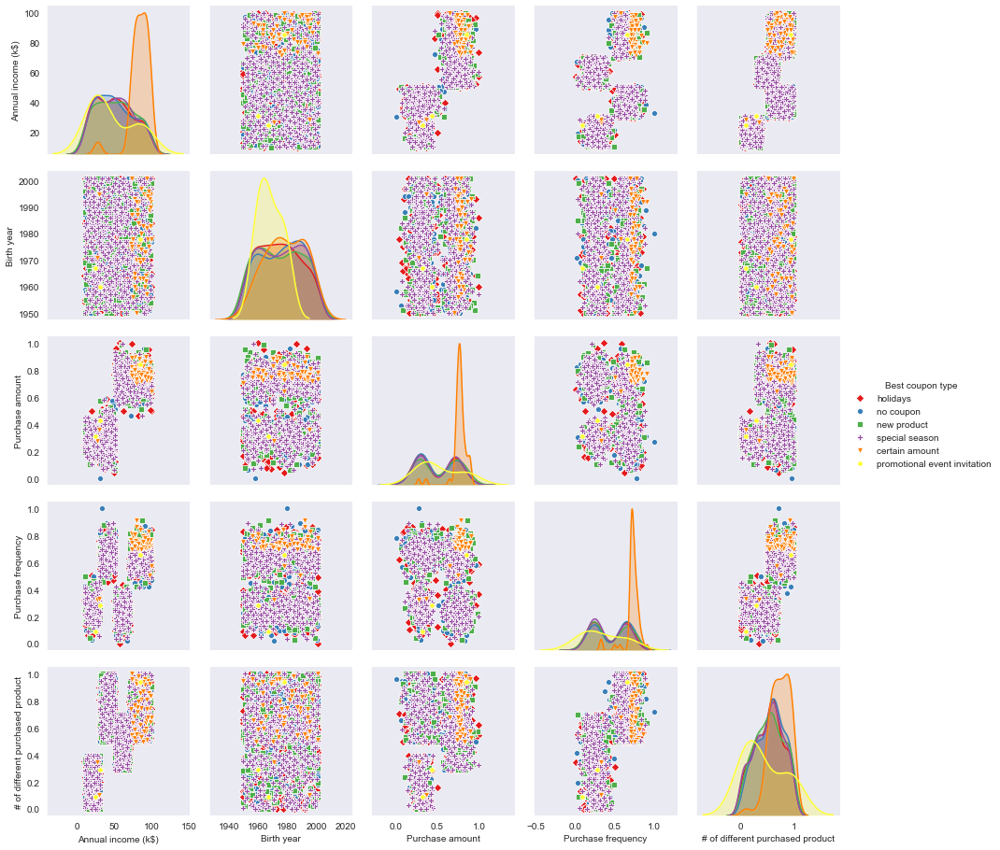

In [25]:
sns.pairplot(df, vars=['Annual income (k$)', 'Birth year', 'Purchase amount',
       'Purchase frequency', '# of different purchased product'], hue="Best coupon type", corner=False, markers=["D", "o", "s", "P", "v", "h"])
plt.show()

* We can see that a certain amount to spend is a very effective couple.

#### Visualization of percentage of Customers per each Country

In [26]:
count = df['Country'].value_counts(sort=True, dropna=True)
perc = df['Country'].value_counts(normalize=True, sort=True, ascending=False, dropna=True)*100
d = pd.concat([perc, count], axis=1, keys=['Percentage %', 'Count'])
# d.to_csv('Customer_per_country.csv') # For tableau visualization
[*d.index]

['USA',
 'Japan',
 'Italy',
 'France',
 'Spain',
 'Germany',
 'UK',
 'Canada',
 'Belgium']

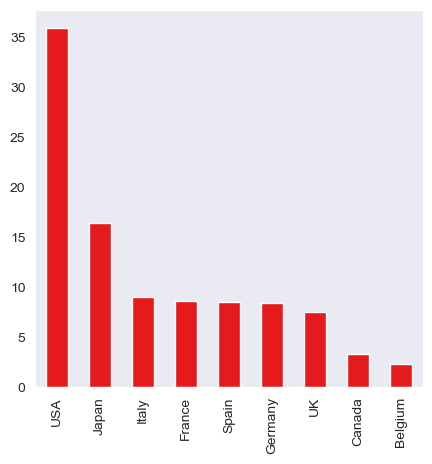

In [27]:
plt.figure(figsize = (5,5), dpi=100)
d['Percentage %'].plot.bar()
plt.show()

### Visualize in the same chart the two total sums of Purchase amount and Purchase frequency in each Country

In [28]:
purchase_country = df[['Country', 'Purchase amount', 'Purchase frequency']].groupby('Country').sum()
purchase_country = purchase_country.sort_values('Purchase amount', ascending=False)
purchase_country
# purchase_country.to_csv('purchase_country.csv') # For Tableau

,Purchase amount,Purchase frequency
Country,,
USA,368.232960,325.313225
Japan,170.282446,146.135267
Italy,96.276240,82.802113
France,87.736198,76.976426
Germany,85.509573,76.422998
Spain,84.779244,75.031430
UK,77.249685,74.124843
Canada,32.488867,28.417778
Belgium,27.050451,23.497021


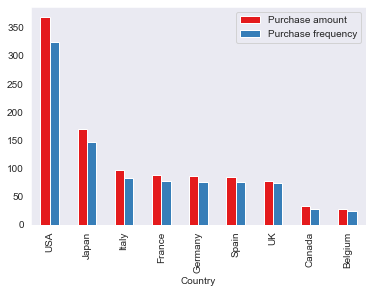

In [29]:
purchase_country.plot.bar()
plt.show()

### Visualize the average Purchase amount and Purchase frequency in each Country

In [30]:
purchase_country_avg = df[['Country', 'Purchase amount', 'Purchase frequency']].groupby('Country').mean()
purchase_country_avg = purchase_country_avg.sort_values('Purchase amount', ascending=False)
purchase_country_avg

,Purchase amount,Purchase frequency
Country,,
Belgium,0.588053,0.510805
Italy,0.531913,0.457470
Japan,0.520741,0.446897
USA,0.512859,0.453082
UK,0.511587,0.490893
France,0.510094,0.447537
Germany,0.508986,0.454899
Spain,0.498701,0.441361
Canada,0.492256,0.430572


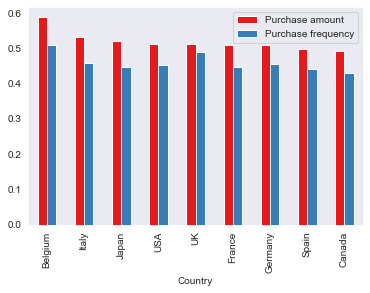

In [31]:
purchase_country_avg.plot.bar()
plt.show()

### Visualize the average Purchase amount and Purchase frequency in each Country

In [32]:
purchase_gender_avg = df[['Gender', 'Purchase amount', 'Purchase frequency']].groupby('Gender').mean()
purchase_gender_avg = purchase_gender_avg.sort_values('Purchase amount', ascending=False)
purchase_gender_avg

,Purchase amount,Purchase frequency
Gender,,
F,0.522839,0.452448
M,0.506591,0.456918


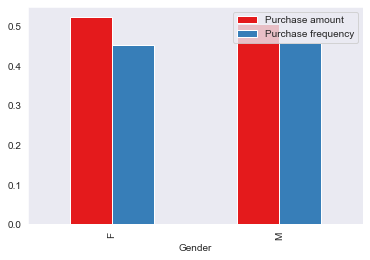

In [33]:
purchase_gender_avg.plot.bar()
plt.show()

### Feature Engineering

#### Big 5 Europe

In [34]:
df['Country'].replace(to_replace=['Italy', 'UK', 'France', 'Germany', 'Spain'], value='Big 5 Europe', inplace=True)

In [35]:
describe_cat(df, 'Country')

Country - 5 unique values.
dtype: object.
No missing values.

              Percentage %  Count
Big 5 Europe     42.121061    842
USA              35.917959    718
Japan            16.358179    327
Canada            3.301651     66
Belgium           2.301151     46



#### Age Column

In [36]:
from datetime import datetime, timedelta

copy = df['Birth year']
current_time = pd.to_datetime('now')

copy = pd.to_datetime(copy, yearfirst=True, format="%Y")
timedelta_ns = current_time - copy
timedelta_years = timedelta_ns.astype('timedelta64[Y]')
df['Age'] = timedelta_years
describe_num(df, 'Age')

Age
Minimum: 19.0
Mean: 44.37
Median: 44.0
Max: 70.0
Standard Deviation: 14.85



Age
Skewness: -0.002, Kurtosis: -1.191


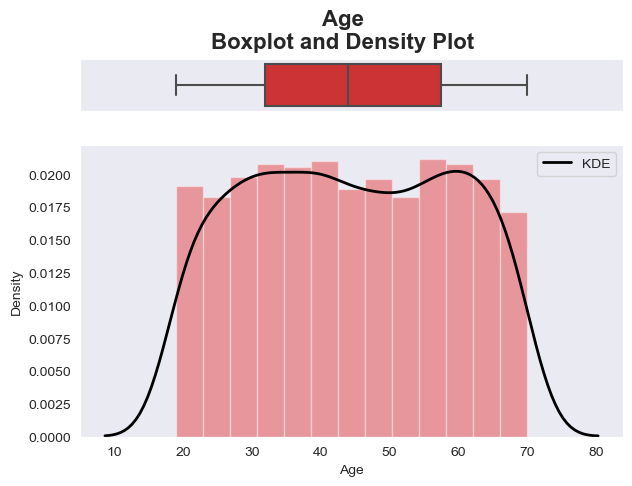

In [37]:
fig, axes = plt.subplots(2, sharex=True, figsize=(7, 5), dpi=100, gridspec_kw={"height_ratios": (.15, .85)})
fig.suptitle(f'Age\nBoxplot and Density Plot', fontweight='bold', fontsize=16)
sns.boxplot(df['Age'], ax=axes[0])
axes[0].set_title('')
axes[0].set_xlabel('')
axes[0].set_ylabel('')
sns.distplot(df['Age'],
             kde_kws={"color": "black", "lw": 2, "label": "KDE"},
             hist_kws={"histtype": "bar", "linewidth": 1, "alpha": 0.4},
             ax=axes[1])
axes[1].set_title('')
axes[1].set_xlabel(f'Age')
axes[1].set_ylabel('Density')
print(f"Age\nSkewness: {skew(df['Age']):0.3f}, Kurtosis: {kurtosis(df['Age']):0.3f}")
plt.show()

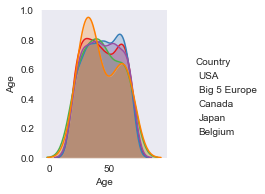

In [38]:
sns.pairplot(df, vars=['Age',], hue="Country", corner=False, markers=["D", "o", "s", "P", "d"])
plt.show()

### How did the situation change?

#### % of Customers per each Country

In [39]:
count = df['Country'].value_counts(sort=True, dropna=True)
perc = df['Country'].value_counts(normalize=True, sort=True, ascending=False, dropna=True)*100
d = pd.concat([perc, count], axis=1, keys=['Percentage %', 'Count'])
d

,Percentage %,Count
Big 5 Europe,42.121061,842
USA,35.917959,718
Japan,16.358179,327
Canada,3.301651,66
Belgium,2.301151,46


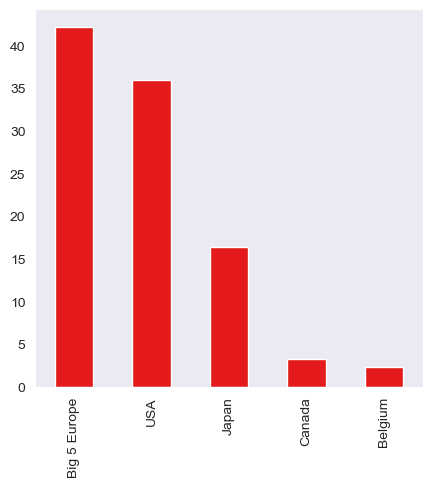

In [40]:
plt.figure(figsize = (5,5), dpi=100)
d['Percentage %'].plot.bar()
plt.show()

### Total Purchase amount and Purchase frequency in each Country

In [41]:
purchase_country = df[['Country', 'Purchase amount', 'Purchase frequency']].groupby('Country').sum()
purchase_country = purchase_country.sort_values('Purchase amount', ascending=False)
# purchase_country.to_csv('purchase_country_g.csv') # For Tableau Viz
purchase_country

,Purchase amount,Purchase frequency
Country,,
Big 5 Europe,431.550940,385.357810
USA,368.232960,325.313225
Japan,170.282446,146.135267
Canada,32.488867,28.417778
Belgium,27.050451,23.497021


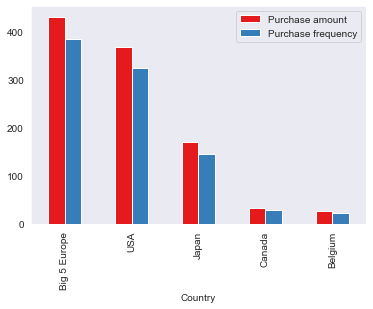

In [42]:
purchase_country.plot.bar()
plt.show()

### Average Purchase amount and Purchase frequency in each Country

In [43]:
purchase_country_avg = df[['Country', 'Purchase amount', 'Purchase frequency']].groupby('Country').mean()
purchase_country_avg = purchase_country_avg.sort_values('Purchase amount', ascending=False)
# purchase_country_avg.to_csv('purchase_country_avg.csv') # For Tableau Viz
purchase_country_avg

,Purchase amount,Purchase frequency
Country,,
Belgium,0.588053,0.510805
Japan,0.520741,0.446897
USA,0.512859,0.453082
Big 5 Europe,0.512531,0.457670
Canada,0.492256,0.430572


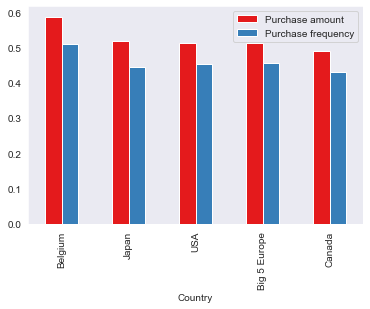

In [44]:
purchase_country_avg.plot.bar()
plt.show()

#### Numerical Feautres (Age included) vs. Country

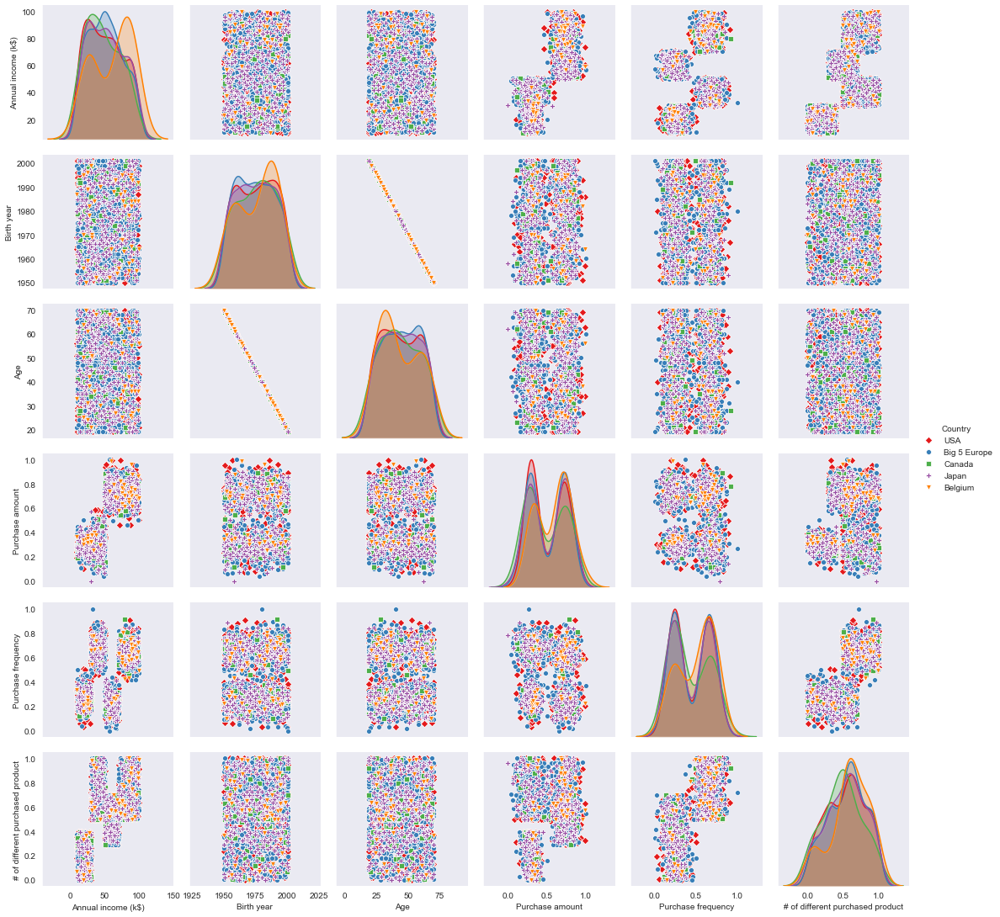

In [45]:
sns.set_style("dark")
sns.set_palette('Set1')
sns.pairplot(df, vars=['Annual income (k$)', 'Birth year', 'Age', 'Purchase amount',
       'Purchase frequency', '# of different purchased product'], hue="Country", corner=False, markers=["D", "o", "s", "P", "v"])
plt.show()

In [46]:
df.to_csv('ConsumerDataset_prepared.csv')
df.head()

,Country,Annual income (k$),Gender,Birth year,Is Parent,Purchase amount,Purchase frequency,# of different purchased product,Is earlier adopter,Preferred purchase channel,Has been reached by marketing,Best coupon type,Age
0,USA,16.9,M,1999,False,0.292497,0.347419,0.323232,False,online mobile,True,holidays,21.0
1,Big 5 Europe,50.5,M,1964,True,0.757364,0.177353,0.505051,False,large store,True,holidays,56.0
2,USA,28.2,F,1999,False,0.266436,0.332183,0.252525,False,online mobile,False,no coupon,21.0
3,USA,86.8,M,1958,True,0.887011,0.613946,0.878788,True,small store,True,new product,62.0
4,Big 5 Europe,30.5,F,1972,True,0.157081,0.727470,0.707071,True,large store,True,new product,48.0


### Scaling
#### Original Distributions

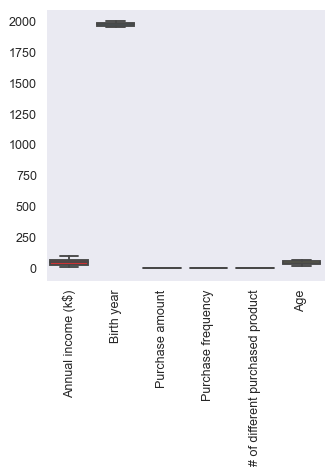

In [47]:
fig = plt.figure(figsize=(4, 4), dpi=90) 
ax = sns.boxplot(data=df[['Annual income (k$)', 'Birth year', 'Purchase amount', 'Purchase frequency', '# of different purchased product', 'Age']])
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()

* We can drop Birth year because it encodes the same information as age, would be redundant.

In [48]:
#df.drop('Birth year', axis=1, inplace=True)
num_f = ['Annual income (k$)', 'Purchase amount', 'Purchase frequency', '# of different purchased product', 'Age']
num = df[['Annual income (k$)', 'Purchase amount', 'Purchase frequency', '# of different purchased product', 'Age']]

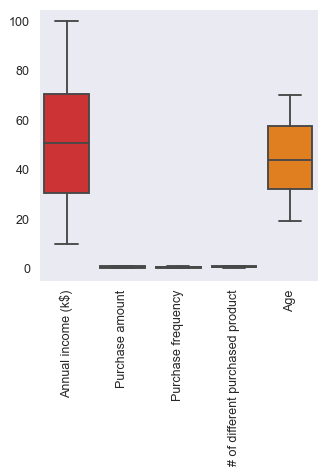

In [49]:
fig = plt.figure(figsize=(4, 4), dpi=90) 
ax = sns.boxplot(data=num)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()

* We can see that we still need to standardize the numeric features, age and annual income are on completely different scales than the other numerical features.

### Standard Scaler

In [50]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_X = scaler.fit_transform(num)
scaled_df = pd.DataFrame(scaled_X, columns=[f"{i}_scaled" for i in num.columns])

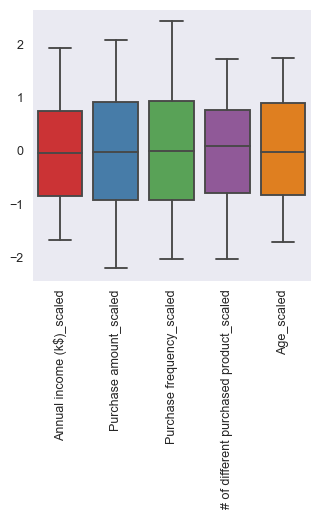

In [51]:
fig = plt.figure(figsize=(4, 4), dpi=90) 
ax = sns.boxplot(data=scaled_df)
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
plt.show()

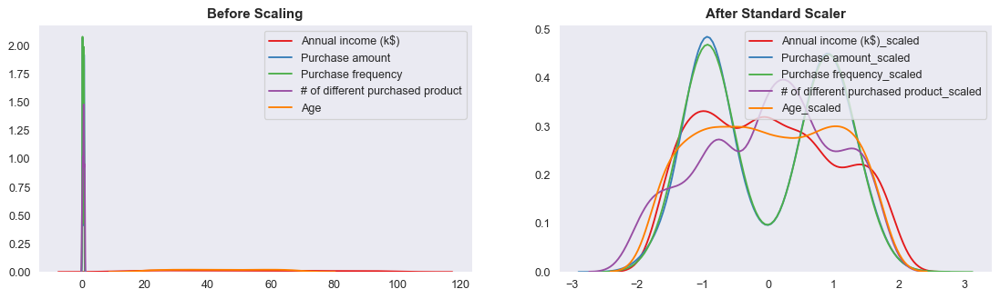

In [52]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 4), dpi=90)

ax1.set_title('Before Scaling', fontweight='bold', fontsize=12)
for i in num.columns:
    sns.kdeplot(num[i], ax=ax1)

ax2.set_title('After Standard Scaler', fontweight='bold', fontsize=12)
for j in scaled_df.columns:
    sns.kdeplot(scaled_df[j], ax=ax2)

#### Getting dummy variables for categorical features

In [53]:
cat_f = ['Country', 'Gender', 'Is Parent', 'Is earlier adopter',
       'Preferred purchase channel', 'Has been reached by marketing',
       'Best coupon type']
cat = df[['Country', 'Gender', 'Is Parent', 'Is earlier adopter',
       'Preferred purchase channel', 'Has been reached by marketing',
       'Best coupon type']]
cat.head()

,Country,Gender,Is Parent,Is earlier adopter,Preferred purchase channel,Has been reached by marketing,Best coupon type
0,USA,M,False,False,online mobile,True,holidays
1,Big 5 Europe,M,True,False,large store,True,holidays
2,USA,F,False,False,online mobile,False,no coupon
3,USA,M,True,True,small store,True,new product
4,Big 5 Europe,F,True,True,large store,True,new product


In [54]:
cat_dummies = pd.get_dummies(cat) # Not dropping one column to preserve interpretability of the clusters, even if computationally-wise would be more efficient.
cat_dummies.head()

,Is Parent,Is earlier adopter,Has been reached by marketing,Country_Belgium,Country_Big 5 Europe,Country_Canada,Country_Japan,Country_USA,Gender_F,Gender_M,Preferred purchase channel_large store,Preferred purchase channel_online desktop,Preferred purchase channel_online mobile,Preferred purchase channel_small store,Best coupon type_certain amount,Best coupon type_holidays,Best coupon type_new product,Best coupon type_no coupon,Best coupon type_promotional event invitation,Best coupon type_special season
0,False,False,True,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0
1,True,False,True,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0
2,False,False,False,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0
3,True,True,True,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0
4,True,True,True,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0


In [55]:
scaled_df.head()

,Annual income (k$)_scaled,Purchase amount_scaled,Purchase frequency_scaled,# of different purchased product_scaled,Age_scaled
0,-1.391952,-0.950836,-0.476430,-0.826213,-1.574632
1,-0.054146,1.035168,-1.232481,-0.145422,0.783137
2,-0.942035,-1.062173,-0.544163,-1.090965,-1.574632
3,1.391161,1.589046,0.708446,1.253982,1.187326
4,-0.850459,-1.529358,1.213132,0.611013,0.244219


In [56]:
X = pd.concat([scaled_df, cat_dummies], axis=1)
X.head()

,Annual income (k$)_scaled,Purchase amount_scaled,Purchase frequency_scaled,# of different purchased product_scaled,Age_scaled,Is Parent,Is earlier adopter,Has been reached by marketing,Country_Belgium,Country_Big 5 Europe,...,Preferred purchase channel_large store,Preferred purchase channel_online desktop,Preferred purchase channel_online mobile,Preferred purchase channel_small store,Best coupon type_certain amount,Best coupon type_holidays,Best coupon type_new product,Best coupon type_no coupon,Best coupon type_promotional event invitation,Best coupon type_special season
0,-1.391952,-0.950836,-0.476430,-0.826213,-1.574632,False,False,True,0,0,...,0,0,1,0,0,1,0,0,0,0
1,-0.054146,1.035168,-1.232481,-0.145422,0.783137,True,False,True,0,1,...,1,0,0,0,0,1,0,0,0,0
2,-0.942035,-1.062173,-0.544163,-1.090965,-1.574632,False,False,False,0,0,...,0,0,1,0,0,0,0,1,0,0
3,1.391161,1.589046,0.708446,1.253982,1.187326,True,True,True,0,0,...,0,0,0,1,0,0,1,0,0,0
4,-0.850459,-1.529358,1.213132,0.611013,0.244219,True,True,True,0,1,...,1,0,0,0,0,0,1,0,0,0


# Clustering keeping all variables

### Dimensionality Reduction

#### Principal Component Analysis

In [57]:
n_components = 7
pca = PCA(n_components)
pca.fit(X)
X_pca = pd.DataFrame(pca.transform(X), columns = [f"PC{i}" for i in range(1,n_components+1)])
print(f"From {X.shape[1]} dimensions to {X_pca.shape[1]}.")

From 25 dimensions to 7.


In [58]:
cum_explained_var = np.cumsum(pca.explained_variance_ratio_)
cum_explained_var_df = pd.DataFrame(cum_explained_var, index = [f"PC{i}" for i in range(1,X_pca.shape[1]+1)]).transpose()
explained_var = pd.DataFrame(pca.explained_variance_ratio_).transpose()
cum_explained_var_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,0.285242,0.445456,0.601558,0.687898,0.736113,0.783348,0.823656


Total explained variance with 7 components: 82.37 %


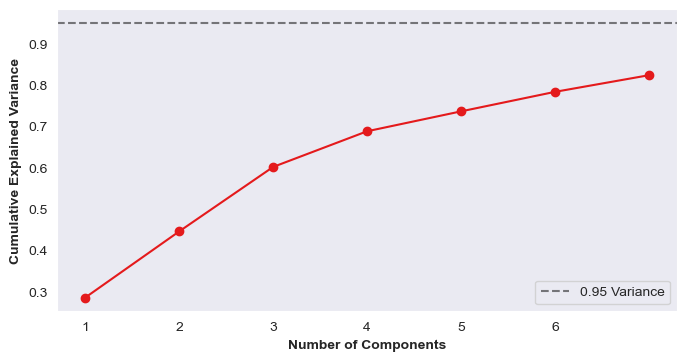

In [59]:
fig, ax = plt.subplots(figsize=(8, 4), dpi=100)

plt.plot(cum_explained_var, linestyle='-', marker='o')
ax.set_xlabel('Number of Components', fontweight='bold')
ax.set_ylabel('Cumulative Explained Variance', fontweight='bold')
ax.axhline(0.95, ls='--', color="black", label="0.95 Variance", alpha=0.5)
ax.set_xticklabels(range(n_components))
plt.legend()
print(f"Total explained variance with {X_pca.shape[1]} components: {cum_explained_var[-1]*100:0.2f} %")
plt.show()

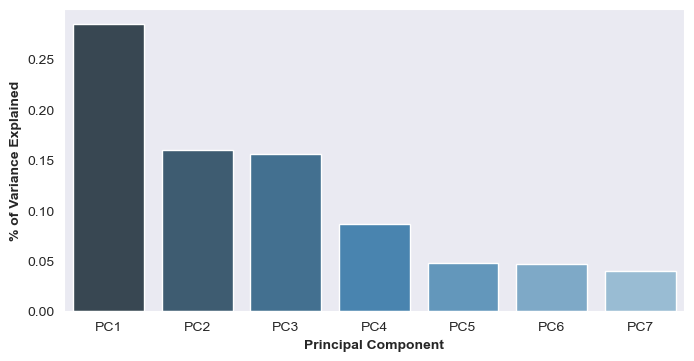

In [60]:
fig, ax = plt.subplots(figsize=(8, 4), dpi=100)
sns.barplot(data=explained_var, palette="Blues_d")
ax.set_xlabel("Principal Component", fontweight='bold')
ax.set_ylabel("% of Variance Explained", fontweight='bold')
ax.set_xticklabels([f"PC{i}" for i in range(1,X_pca.shape[1]+1)])
plt.show()

In [61]:
pc_df = pd.DataFrame(pca.components_,index=[f"PC{i}" for i in range(1,X_pca.shape[1]+1)],columns=X.columns)
pc_df

,Annual income (k$)_scaled,Purchase amount_scaled,Purchase frequency_scaled,# of different purchased product_scaled,Age_scaled,Is Parent,Is earlier adopter,Has been reached by marketing,Country_Belgium,Country_Big 5 Europe,...,Preferred purchase channel_large store,Preferred purchase channel_online desktop,Preferred purchase channel_online mobile,Preferred purchase channel_small store,Best coupon type_certain amount,Best coupon type_holidays,Best coupon type_new product,Best coupon type_no coupon,Best coupon type_promotional event invitation,Best coupon type_special season
PC1,0.591009,0.424721,0.411475,0.547361,0.006405,-0.008295,0.004310,-0.002311,0.005601,0.004723,...,0.006458,-0.009371,0.003716,-0.000803,0.024693,-0.013661,0.000295,0.002311,-0.000315,-0.013324
PC2,-0.247808,-0.546671,0.527119,0.290660,0.454704,0.140787,-0.002098,-0.018517,-0.002821,0.017203,...,0.047152,-0.119073,-0.077432,0.149353,-0.003146,0.022437,-0.005466,0.018517,0.000007,-0.032350
PC3,-0.148343,-0.331255,0.332993,0.174091,-0.740752,-0.244275,-0.009572,-0.028272,0.000741,-0.007042,...,-0.094386,0.190357,0.133445,-0.229417,0.003285,-0.023377,-0.009837,0.028272,-0.000973,0.002631
PC4,0.023749,0.023358,-0.030073,-0.013484,-0.057725,-0.011397,0.010586,-0.005584,-0.008011,0.040950,...,-0.004243,-0.021085,0.047941,-0.022613,0.000687,0.400367,0.009188,0.005584,0.000437,-0.416263
PC5,-0.007262,0.031917,-0.006607,-0.023135,0.028728,0.011111,0.224149,-0.498701,-0.000853,-0.379322,...,-0.050787,0.036822,-0.016319,0.030285,-0.011769,-0.277798,0.099421,0.498701,0.000043,-0.308598
PC6,-0.013482,0.009503,-0.047423,0.017669,-0.019908,0.032732,0.091211,-0.319354,-0.005080,0.614715,...,0.064648,-0.030665,-0.000332,-0.033652,-0.000041,-0.179806,0.016862,0.319354,-0.000111,-0.156259
PC7,-0.027310,0.000402,0.029029,-0.005210,-0.010508,-0.008802,0.626902,0.275171,0.003755,0.042719,...,-0.001101,0.005215,-0.000646,-0.003468,-0.000143,-0.177345,0.623695,-0.275171,0.000753,-0.171789


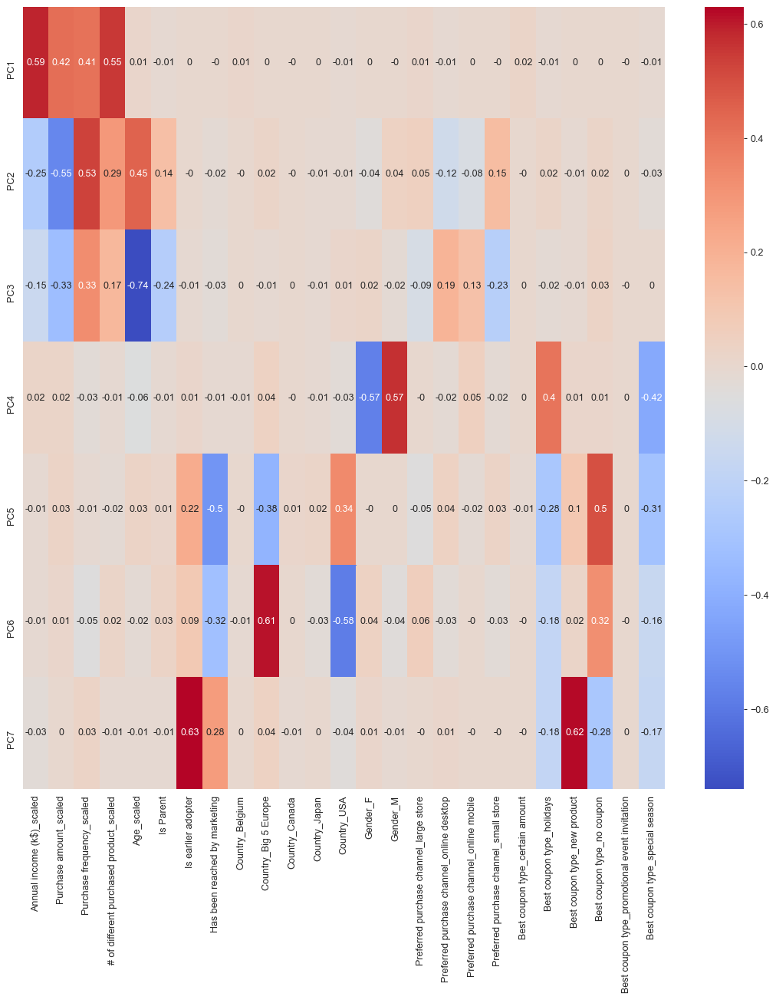

In [62]:
plt.figure(figsize = (15,15), dpi=90)
sns.heatmap(data=pc_df.round(2), cmap='coolwarm', annot=True, annot_kws={"size":10})
plt.show()

#### Interpretation
* **PC1** Numerical features proxy but age.
* **PC2** Numerical features proxy with age, opposite correlation for purchase amount and annnual income compared to PC1.

In [63]:
print(f"Explained variance with 2 component: {cum_explained_var[1]*100:0.2f} %")
print(f"Explained variance with 3 component: {cum_explained_var[2]*100:0.2f} %")

Explained variance with 2 component: 44.55 %
Explained variance with 3 component: 60.16 %


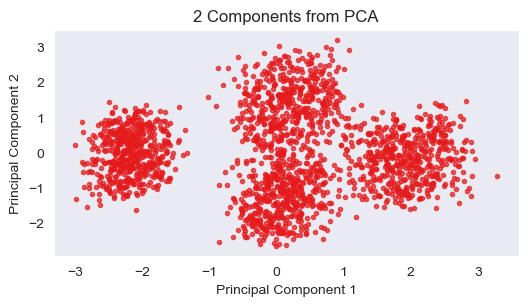

In [64]:
# 2D graph

fig, ax = plt.subplots(figsize=(6, 3), dpi=100)
ax.set_title('2 Components from PCA')

ax.scatter(X_pca['PC1'], X_pca['PC2'], marker='.',alpha=0.7)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')

plt.show()

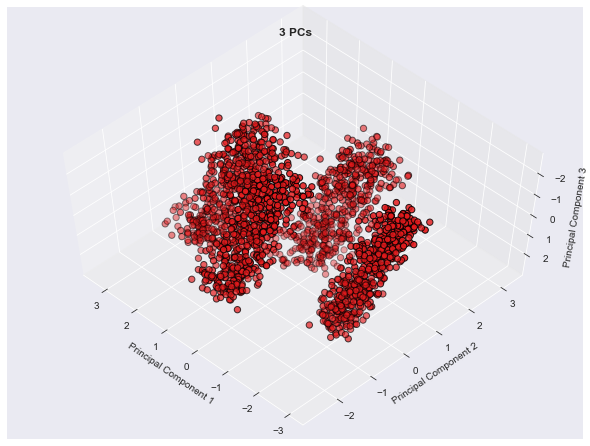

In [65]:
# 3D graph

fig = plt.figure(1, figsize=(8, 6))
ax = Axes3D(fig, elev=-120, azim=45)
ax.scatter(X_pca['PC1'], X_pca['PC2'], X_pca['PC3'], cmap=plt.cm.Set1, edgecolor='k', s=40)
ax.set_title("3 PCs", fontweight="bold")
ax.set_xlabel("Principal Component 1")
ax.set_ylabel("Principal Component 2")
ax.set_zlabel("Principal Component 3")

plt.savefig("3PCs.png")
plt.show()

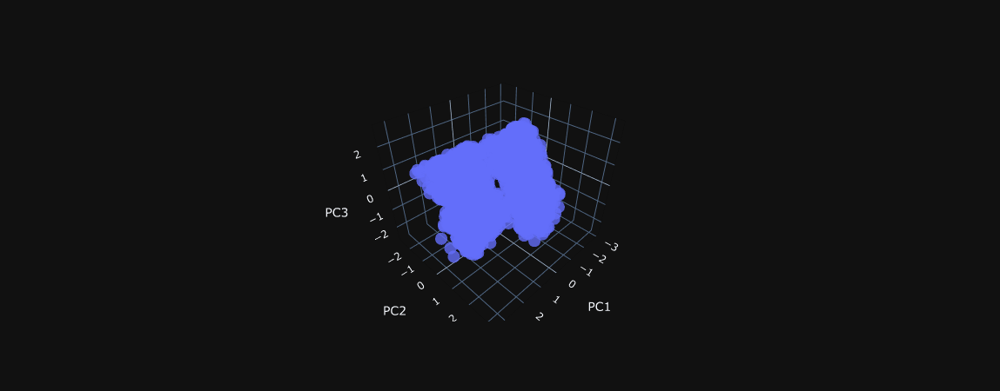

In [66]:
# 3D interactive graph - needs plotly jupyterlab extension

import plotly.express as px

fig = px.scatter_3d(X_pca,
                    x="PC1",
                    y="PC2",
                    z="PC3",
                    template="plotly_dark",
                   opacity=0.8)
fig.show()

### tSNE

In [67]:
tSNE_components = 2
X_tsne = pd.DataFrame(TSNE(
    n_components=tSNE_components,
    perplexity=35.0,
    early_exaggeration=12.0,
    learning_rate=200.0,
    n_iter=1000,
    n_iter_without_progress=300,
    min_grad_norm=1e-07,
    metric='euclidean',
    init='random',
    verbose=0,
    random_state=42,
    method='barnes_hut',
    angle=0.5,
    n_jobs=None,
).fit_transform(X), columns = [f"tSNE{i}" for i in range(1,tSNE_components+1)])

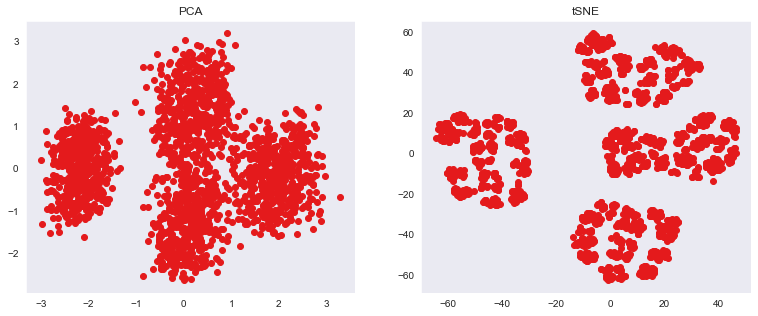

In [68]:
figure,ax = plt.subplots(1,2,figsize=(13,5))
ax[0].scatter(X_pca.iloc[:,0],X_pca.iloc[:,1])
ax[0].set_title('PCA')
ax[1].scatter(X_tsne.iloc[:,0],X_tsne.iloc[:,1])
ax[1].set_title('tSNE')
plt.show()

In [69]:
# Settings
clust_techniques = ['KMeans','Agglomerative','DBSCAN']

visualize = False
verbose = False

parameters = {'metric': ['euclidean','l1','l2','manhattan']
#             Kmeans, Agglomerative  
              , 'n_clusters': [3,4,5,6,7]
#             kMeans params  
              , 'init': ['random','k-means++']
              , 'n_init': [10]
              , 'max_iter': [300]
              , 'random_state': [0]
#             Agglomerative  
              , 'linkage': ['ward', 'average', 'complete', 'single']
#             DBSCAN  
              , 'eps': np.arange(1,2.1,0.1)
              , 'min_samples': np.arange(2,57,4)
             }
print("Possible parameters\n",parameters)
print("\nDataset head\n",X_tsne.head())


Possible parameters
 {'metric': ['euclidean', 'l1', 'l2', 'manhattan'], 'n_clusters': [3, 4, 5, 6, 7], 'init': ['random', 'k-means++'], 'n_init': [10], 'max_iter': [300], 'random_state': [0], 'linkage': ['ward', 'average', 'complete', 'single'], 'eps': array([1. , 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. ]), 'min_samples': array([ 2,  6, 10, 14, 18, 22, 26, 30, 34, 38, 42, 46, 50, 54])}

Dataset head
        tSNE1      tSNE2
0 -38.131386  15.907619
1  12.728615  26.284830
2 -45.115158  14.476636
3  43.903385  -4.303916
4   3.300646 -56.348808


In [70]:
import itertools as it
def get_params_comb(parameters, clust_technique):
    
    my_dict=parameters.copy()
    
    if clust_technique == 'KMeans': 
        del(my_dict['linkage'])
        
        del(my_dict['eps'])
        del(my_dict['min_samples'])
        
    elif clust_technique == 'Agglomerative':
        del(my_dict['init'])
        del(my_dict['n_init'])
        del(my_dict['max_iter'])
        del(my_dict['random_state'])
        
        del(my_dict['eps'])
        del(my_dict['min_samples'])
        
    elif clust_technique == 'DBSCAN':
        del(my_dict['n_clusters'])
        
        del(my_dict['init'])
        del(my_dict['n_init'])
        del(my_dict['max_iter'])
        del(my_dict['random_state'])
        
        del(my_dict['linkage'])


    allNames = sorted(my_dict)
    combinations = list(it.product(*(my_dict[Name] for Name in allNames)))
    
    return combinations, allNames

def get_params(parameters, iteration, clust_technique):
    
    names = get_params_comb(parameters, clust_technique)[1]
    params = {}
    for n in range(len(names)):
        
        params[names[n]] = get_params_comb(parameters
                                           , clust_technique)[0][iteration][n]

    return params

def pred_clust(X, clust_technique, parameters):
    
    if clust_technique == 'KMeans':
        
        model = KMeans(n_clusters=parameters['n_clusters']
                       , init=parameters['init'], n_init=parameters['n_init']
                       , max_iter=parameters['max_iter']
                       , random_state=parameters['random_state'])
        
        y_pred = model.fit_predict(X)


    elif clust_technique == 'Agglomerative':
        
        model = AgglomerativeClustering(linkage=parameters['linkage']
                                        , n_clusters=parameters['n_clusters']
                                        , affinity=parameters['metric'])
        model.fit(X)
        
        y_pred = model.labels_
        
    elif clust_technique == 'DBSCAN':
        
        model = DBSCAN(eps=parameters['eps']
                      , min_samples=parameters['min_samples']
                      , metric=parameters['metric'])
        model.fit(X)
        y_pred = model.labels_

    return y_pred

def viz_clust(silhouette_vals,y,X): 
    y_ax_lower, y_ax_upper=0,0
    
    f, axes = plt.subplots(1,2, figsize=(10,5))
    
    for i in np.unique(y):
        c_silhouette_vals = silhouette_vals[y==i]
        c_silhouette_vals.sort()
        y_ax_upper += len(c_silhouette_vals)
        axes[0].barh(range(y_ax_lower, y_ax_upper)
                         , c_silhouette_vals, height=1)
        y_ax_lower += len(c_silhouette_vals)
        
        axes[1].scatter(X.iloc[y==i,0],X.iloc[y==i,1],s=50,label='cluster '+str(i+1))

    
    silhouette_avg = np.mean(silhouette_vals)
    axes[0].axvline(silhouette_avg, color='red',linestyle='--')
    axes[0].set_ylabel('Cluster')
    axes[0].set_xlabel('Silhouette Coefficient')
    
    axes[1].set_ylabel(X.columns[1])
    axes[1].set_xlabel(X.columns[0])
    plt.show()

In [71]:
# Initialize variables
X = X_tsne.copy()
best_silh_list,best_ch_list = [],[]

# Loop: evaluate all the considered clustering techniques
for clust_technique in clust_techniques:
    
    # Initialize variables
    best_silh,best_ch = 0,0
    iterations_number = len(get_params_comb(parameters,clust_technique)[0])
    if verbose:
        print( "\n---------------------------------------------------------------------------------------------------------------\n"
              , "\nClustering technique: ", clust_technique
              , "\nNumber of possible combinations: ",iterations_number,"\n")

    # Loop: evaluate all the possible combinations
    for i in range(iterations_number):
        params = get_params(parameters, i, clust_technique)
        
        if (clust_technique=='Agglomerative'):
            if (params['linkage']=='ward')&(params['metric']!='euclidean'):
                continue
        
        y_pred = pred_clust(X, clust_technique, params)
 
        if len(np.unique(y_pred))<2: continue # in case only 1 cluster is found
        
        silhouette_avg = silhouette_score(X, y_pred, metric=params['metric'])
        
        if verbose:
            print(  "\n- Clustering technique:", clust_technique
                  , "\n- Combination #",i
                  , "\n- Parameters\n",params
                  , "\n\n> The average silhouette_score is:", silhouette_avg)     

        if visualize:
            silhouette_vals = silhouette_samples(X,y_pred,metric=params['metric'])
            viz_clust(silhouette_vals,y_pred,X)

            
        # Update best scores in case of improvement
        # Silhouette score
        if silhouette_avg>best_silh:
            best_silh = silhouette_avg
            best_silh_params = params
            best_silh_i = i
        # Calinski Harabasz Score (variance ratio criterion)
        ch_score = calinski_harabasz_score(X,y_pred)
        if ch_score>best_ch:
            best_ch = ch_score
            best_ch_params = params
            best_ch_i = i
            
    print(  "\n-------------------------------------   SUMMARY",clust_technique,"METHOD   ------------------------------------------"
          , "\n Silhouette"
          , "\n> Best combination #:",best_silh_i
          , "\n> Best AVG SILHOUETTE:",best_silh
          , "\n> Best PARAMETERS:",best_silh_params
          , "\n Calinski-Harabasz"
          , "\n> Best combination #:",best_ch_i
          , "\n> Best C-H SCORE:",best_ch
          , "\n> Best PARAMETERS:",best_ch_params
          , "\n-----------------------------------------------------------------------------------------------------------------\n\n")

    best_silh_dict = {'Method':clust_technique, 'Parameters':best_silh_params, 'Score':best_silh}
    best_silh_list.append(best_silh_dict)
    
    best_ch_dict = {'Method':clust_technique, 'Parameters':best_ch_params, 'Score':best_ch}
    best_ch_list.append(best_ch_dict)

best_list = [best_silh_list,best_ch_list]


-------------------------------------   SUMMARY KMeans METHOD   ------------------------------------------ 
 Silhouette 
> Best combination #: 6 
> Best AVG SILHOUETTE: 0.5780290330709705 
> Best PARAMETERS: {'init': 'random', 'max_iter': 300, 'metric': 'l1', 'n_clusters': 4, 'n_init': 10, 'random_state': 0} 
 Calinski-Harabasz 
> Best combination #: 1 
> Best C-H SCORE: 3932.151156661897 
> Best PARAMETERS: {'init': 'random', 'max_iter': 300, 'metric': 'euclidean', 'n_clusters': 4, 'n_init': 10, 'random_state': 0} 
-----------------------------------------------------------------------------------------------------------------



-------------------------------------   SUMMARY Agglomerative METHOD   ------------------------------------------ 
 Silhouette 
> Best combination #: 26 
> Best AVG SILHOUETTE: 0.5780290330709705 
> Best PARAMETERS: {'linkage': 'average', 'metric': 'l1', 'n_clusters': 4} 
 Calinski-Harabasz 
> Best combination #: 1 
> Best C-H SCORE: 3932.151156661897 
> Bes

Number of clusters: 2 => Average Silhouette Score: 0.43322503566741943
Number of clusters: 3 => Average Silhouette Score: 0.5506240725517273
Number of clusters: 4 => Average Silhouette Score: 0.5719470977783203
Number of clusters: 5 => Average Silhouette Score: 0.549028754234314
Number of clusters: 6 => Average Silhouette Score: 0.5130504965782166


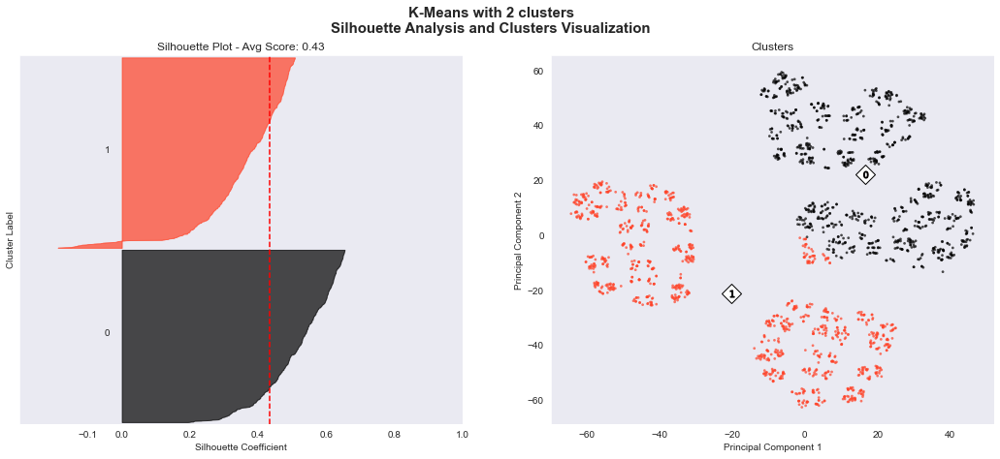

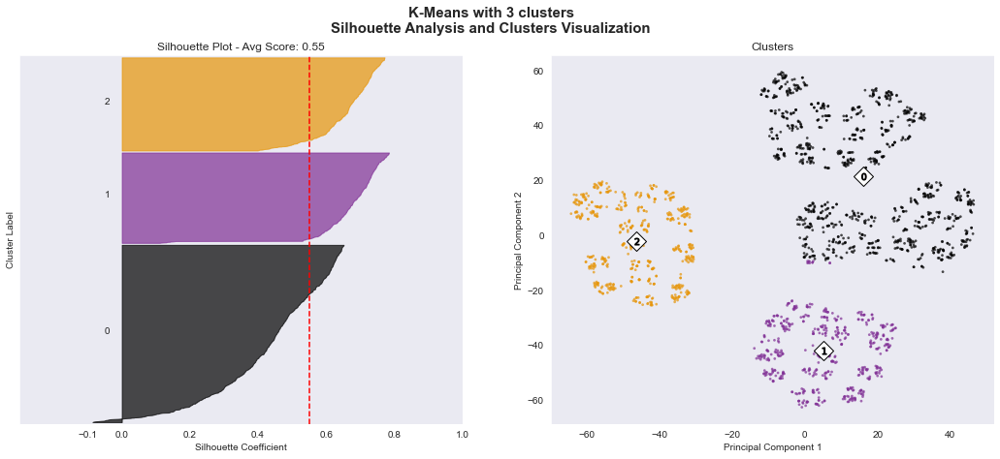

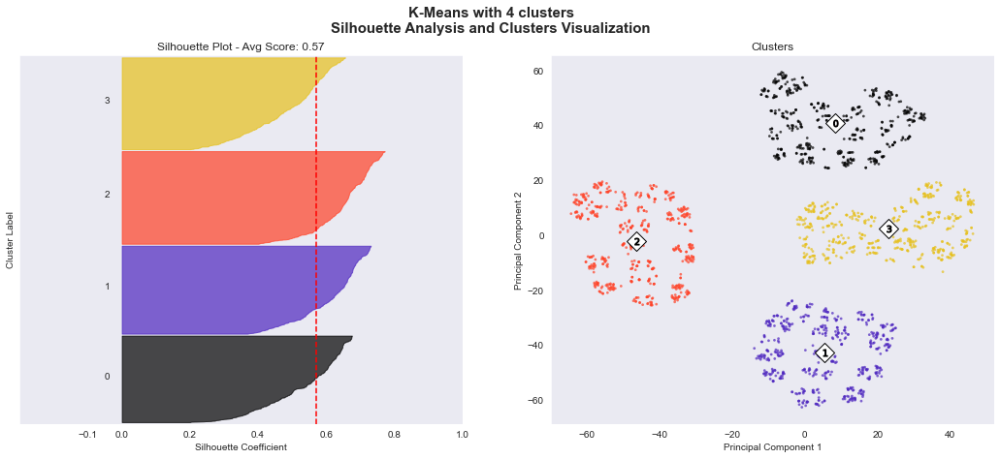

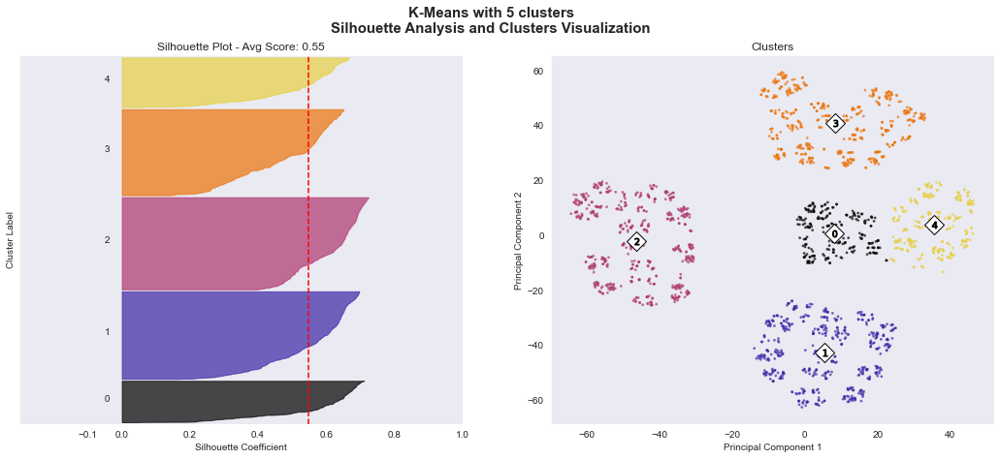

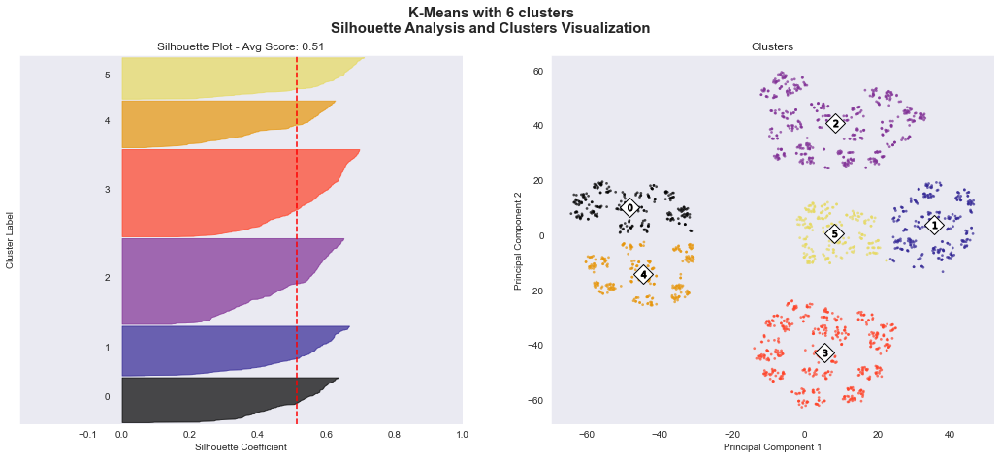

In [72]:
range_n_clusters = [2, 3, 4, 5, 6]

to_viz = X_tsne
for n_clusters in range_n_clusters:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The silhouette coefficient can range from -1, 1, however we hope not to get such a bad coefficient
    ax1.set_xlim([-0.3, 1])
    ax1.set_ylim([0, len(to_viz) + (n_clusters + 1) * 10])

    clusterer = KMeans(n_clusters=n_clusters, max_iter=300, random_state=42)
    cluster_labels = clusterer.fit_predict(to_viz)

    silhouette_avg = silhouette_score(to_viz, cluster_labels)
    print(f"Number of clusters: {n_clusters} => Average Silhouette Score: {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(to_viz, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.get_cmap("CMRmap")(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title(f"Silhouette Plot - Avg Score: {silhouette_avg:0.2f}")
    ax1.set_xlabel("Silhouette Coefficient")
    ax1.set_ylabel("Cluster Label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.get_cmap("CMRmap")(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(to_viz.iloc[:, 0], to_viz.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_

    ax2.scatter(centers[:, 0], centers[:, 1], marker='D',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("Clusters")
    ax2.set_xlabel("Principal Component 1")
    ax2.set_ylabel("Principal Component 2")

    plt.suptitle((f"K-Means with {n_clusters} clusters\nSilhouette Analysis and Clusters Visualization"),
                 fontsize=15, fontweight='bold')

plt.show()


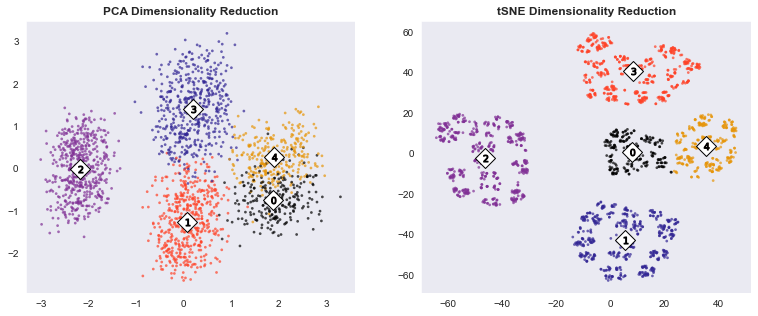

In [125]:
# Choosing 5 clusters - Run twice if colors are wrong
sns.set_style('dark')
figure,ax = plt.subplots(1,2,figsize=(13,5))

colors = cm.get_cmap("CMRmap")(cluster_labels.astype(float) / n_clusters)

# PCA

clusterer = KMeans(n_clusters=5, max_iter=300, random_state=42)
cluster_labels = clusterer.fit_predict(X_pca)

ax[0].set_title('PCA Dimensionality Reduction', fontweight='bold')
ax[0].scatter(X_pca.iloc[:, 0], X_pca.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7, c=colors, edgecolor='k')

# Centroids
centers = clusterer.cluster_centers_
ax[0].scatter(centers[:, 0], centers[:, 1], marker='D', c="white", alpha=1, s=200, edgecolor='k')
for i, c in enumerate(centers):
    ax[0].scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')


# tSNE

clusterer = KMeans(n_clusters=5, max_iter=300, random_state=42)
cluster_labels = clusterer.fit_predict(X_tsne)

ax[1].set_title('tSNE Dimensionality Reduction', fontweight='bold')
ax[1].scatter(X_tsne.iloc[:, 0], X_tsne.iloc[:, 1], marker='.', s=30, lw=0, alpha=0.7, c=colors, edgecolor='k')

# Centroids
centers = clusterer.cluster_centers_
ax[1].scatter(centers[:, 0], centers[:, 1], marker='D',
                c="white", alpha=1, s=200, edgecolor='k')
for i, c in enumerate(centers):
    ax[1].scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50, edgecolor='k')

plt.show()

# Interpretation

In [74]:
clusterer = KMeans(n_clusters=5, max_iter=300, random_state=42)
cluster_labels = clusterer.fit_predict(X_tsne)
fin = df.copy()
fin['Labels'] = cluster_labels

In [76]:
describe_cat(fin, 'Labels')

Labels - 5 unique values.
dtype: int32.
No missing values.

   Percentage %  Count
2     25.812906    516
1     24.512256    490
3     24.112056    482
4     13.956978    279
0     11.605803    232



In [77]:
country = pd.crosstab(fin['Labels'], fin['Country'], normalize='columns').apply(lambda x: np.round(x*100,2))
country

Country,Belgium,Big 5 Europe,Canada,Japan,USA
Labels,,,,,
0,32.61,9.03,10.61,13.46,12.53
1,15.22,26.25,21.21,23.24,23.96
2,21.74,23.63,33.33,25.69,27.99
3,10.87,26.01,22.73,25.08,22.42
4,19.57,15.08,12.12,12.54,13.09


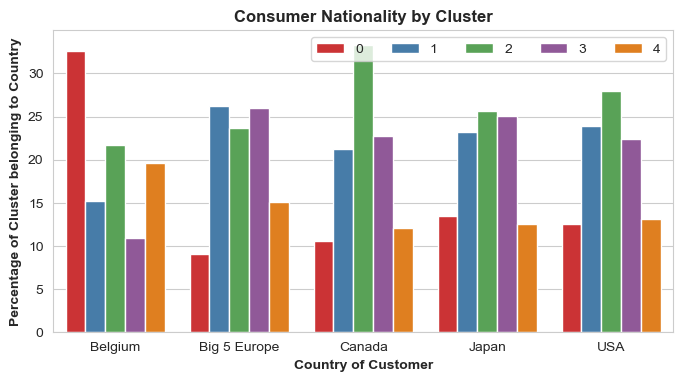

In [78]:
sns.set_style("whitegrid")
sns.set_palette('Set1')
fig, ax = plt.subplots(figsize=(8, 4), dpi=100)
sns.barplot(data=country.stack().reset_index(), x='Country', y=0, hue='Labels')

plt.title("Consumer Nationality by Cluster", fontweight='bold')
ax.set_xlabel("Country of Customer", fontweight='bold')
ax.set_ylabel("Percentage of Cluster belonging to Country", fontweight='bold')

# Showing 50% threshold
#ax.axhline(y=50, color='black', linestyle='--', lw=1)
ax.legend(ncol=5)

plt.show()

In [79]:
marketing = pd.crosstab(fin['Labels'], fin['Has been reached by marketing'], normalize='index').apply(lambda x: np.round(x*100,2))
marketing

Has been reached by marketing,False,True
Labels,,
0,20.26,79.74
1,25.71,74.29
2,19.77,80.23
3,17.84,82.16
4,20.07,79.93


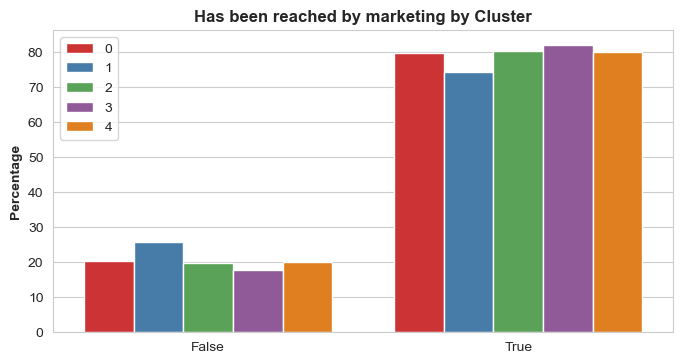

In [80]:
sns.set_style("whitegrid")
sns.set_palette('Set1')
fig, ax = plt.subplots(figsize=(8, 4), dpi=100)
sns.barplot(data=marketing.stack().reset_index(), x='Has been reached by marketing', y=0, hue='Labels')

plt.title("Has been reached by marketing by Cluster", fontweight='bold')
ax.set_xlabel("", fontweight='bold')
ax.set_ylabel("Percentage", fontweight='bold')

# Showing 50% threshold
#ax.axhline(y=50, color='black', linestyle='--', lw=1)
ax.legend()

plt.show()

In [81]:
early = pd.crosstab(fin['Labels'], fin['Is earlier adopter'], normalize='index').apply(lambda x: np.round(x*100,2))
early

Is earlier adopter,False,True
Labels,,
0,78.45,21.55
1,78.98,21.02
2,80.81,19.19
3,76.56,23.44
4,79.57,20.43


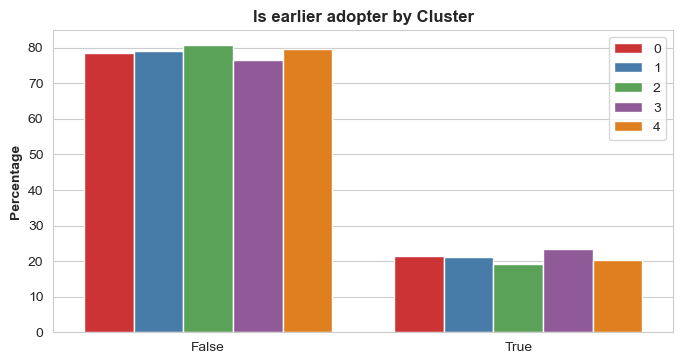

In [82]:
sns.set_style("whitegrid")
sns.set_palette('Set1')
fig, ax = plt.subplots(figsize=(8, 4), dpi=100)
sns.barplot(data=early.stack().reset_index(), x='Is earlier adopter', y=0, hue='Labels')

plt.title("Is earlier adopter by Cluster", fontweight='bold')
ax.set_xlabel("", fontweight='bold')
ax.set_ylabel("Percentage", fontweight='bold')

# Showing 50% threshold
#ax.axhline(y=50, color='black', linestyle='--', lw=1)
ax.legend()

plt.show()

In [83]:
channel = pd.crosstab(fin['Labels'], fin['Preferred purchase channel'], normalize='index').apply(lambda x: np.round(x*100,2))
channel

Preferred purchase channel,large store,online desktop,online mobile,small store
Labels,,,,
0,0.00,65.09,34.48,0.43
1,25.10,34.29,14.69,25.92
2,25.39,34.69,15.31,24.61
3,25.31,37.76,14.94,21.99
4,50.54,3.58,2.15,43.73


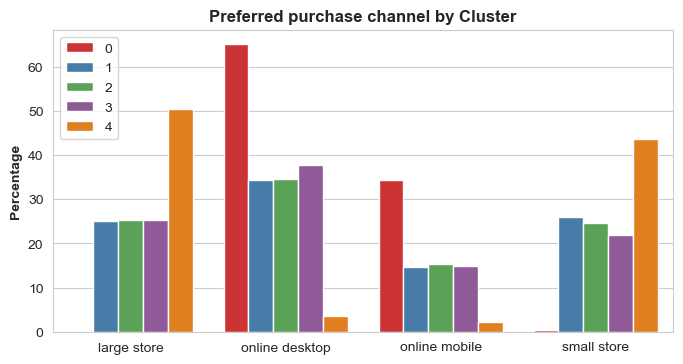

In [84]:
sns.set_style("whitegrid")
sns.set_palette('Set1')
fig, ax = plt.subplots(figsize=(8, 4), dpi=100)
sns.barplot(data=channel.stack().reset_index(), x='Preferred purchase channel', y=0, hue='Labels')

plt.title("Preferred purchase channel by Cluster", fontweight='bold')
ax.set_xlabel("", fontweight='bold')
ax.set_ylabel("Percentage", fontweight='bold')

# Showing 50% threshold
#ax.axhline(y=50, color='black', linestyle='--', lw=1)
ax.legend()

plt.show()

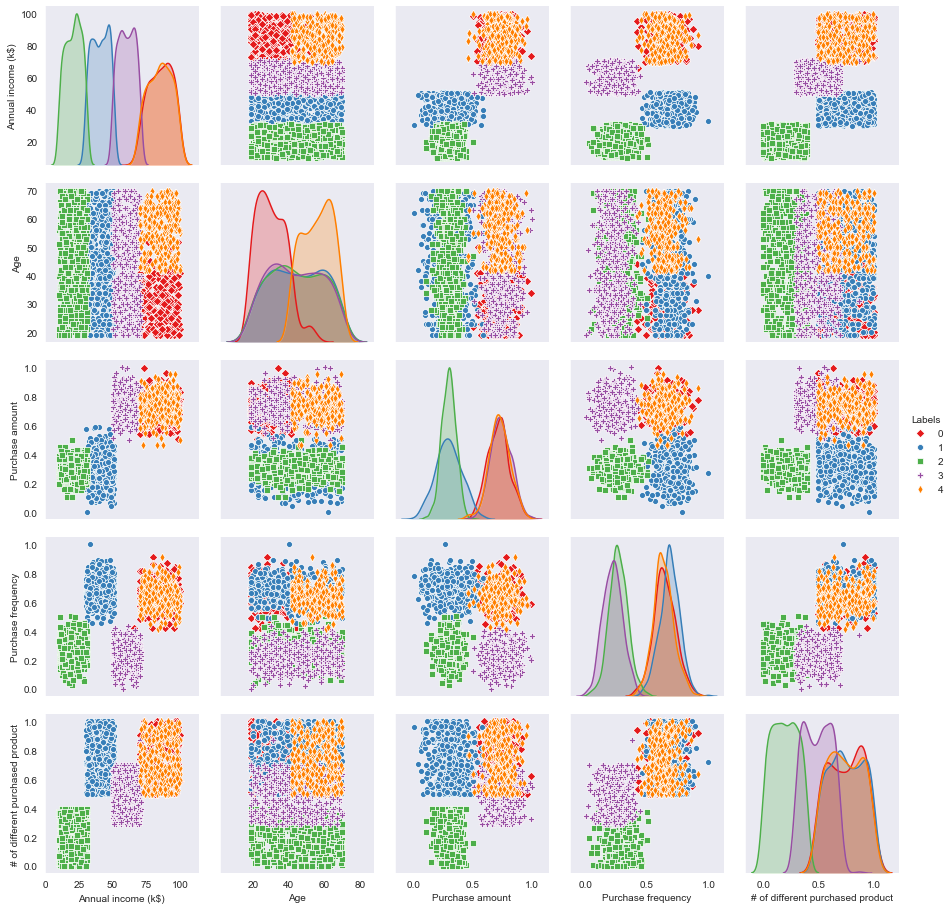

In [85]:
sns.set_style("dark")
sns.pairplot(fin, vars=['Annual income (k$)', 'Age', 'Purchase amount',
       'Purchase frequency', '# of different purchased product'], hue="Labels", corner=False, markers=["D", "o", "s", "P", "d"])
plt.show()

In [86]:
uni = fin[['Labels', 'Age', 'Annual income (k$)', 'Purchase amount', 'Purchase frequency', '# of different purchased product']].groupby('Labels').median()
uni = uni.sort_values('Annual income (k$)', ascending=False)
uni

,Age,Annual income (k$),Purchase amount,Purchase frequency,# of different purchased product
Labels,,,,,
0,29.0,86.05,0.724193,0.643576,0.752525
4,57.0,85.70,0.726525,0.629117,0.737374
3,43.5,60.70,0.739044,0.225855,0.494949
1,44.0,41.20,0.299829,0.686294,0.742424
2,43.5,21.50,0.300456,0.263977,0.191919


## Cluster 0: Young High-Earners
Demographics:
* YOUNG people, median age **29 years**
* HIGH annual income (median: **86k\$** )
* In BELGIUM there is the higher percentage of them (**33\%** of the entire Belgian consumer base)

Behavior:
* VERY HIGH exposure to the Swiffer product line (**75\%** median percentage of purchased products)
* FREQUENT shoppers, median purchase frequency **64\%**
* VERY HIGH purchase amount (median: **72\%**)
* They prefer ONLINE shooping (They NEVER go to large stores and almost never to small stores. **65\%** of them shops through online desktop, **35\%** of them through online mobile)

## Cluster 1: Frequent Low-Spenders
Demographics:
* MIDDLE-AGED people, median age **44 years**
* Average annual income (median: **41k\$** )
* In CANADA there is the higher percentage of them (**33\%** of the entire Canadian consumer base)

Behavior:
* VERY HIGH exposure to the Swiffer product line (**74\%** median percentage of purchased products)
* FREQUENT shoppers, highest median purchase frequency (**68\%**)
* VERY LOW purchase amount (median: **30\%**)
* They prefer ONLINE DESKTOP shopping, however there are no strong differences in the channel they prefer

## Cluster 2: Non-Exposed Low-Spenders
Demographics:
* MIDDLE-AGED people, median age **43.5 years**
* LOW annual income (median: **22k\$** )
* In CANADA there is the higher percentage of them (**33\%** of the entire Canadian consumer base)

Behavior:
* VERY LOW exposure to the Swiffer product line (**19\%** median percentage of purchased products)
* NON-FREQUENT shoppers, lowest median purchase frequency (**26\%**).
* VERY LOW purchase amount (median: **30\%**)
* They prefer ONLINE DESKTOP shopping, however there are no strong differences in the channel they prefer.

## Cluster 3: Un-Frequent High-Spenders
Demographics:
* MIDDLE-AGED people, median age **43.5 years**
* MEDIUM-HIGH annual income (median: **61k\$** )
* In JAPAN and EUROPE there is the higher percentage of them

Behavior:
* AVERAGE exposure to the Swiffer product line (**50\%** median percentage of purchased products)
* MOST NON-FREQUENT shoppers, lowest median purchase frequency (**22\%**).
* HIGHEST purchase amount (median: **74\%**)
* They prefer ONLINE DESKTOP shopping, however there are no strong differences in the channel they prefer.

## Cluster 4: Old High-Earners
Demographics:
* OLDER people, median age **57 years**
* HIGH annual income (median: **86k\$** )
* In BELGIUM there is the higher percentage of them (**19\%** of the entire Belgian consumer base)

Behavior:
* VERY HIGH exposure to the Swiffer product line (**74\%** median percentage of purchased products)
* FREQUENT shoppers, median purchase frequency **63\%**
* VERY HIGH purchase amount (median: **73\%**)
* They prefer PHYSICAL stores (Only **6\%** of them shops online, the remaining overwhelming majority prefers stores)

In [87]:
describe_cat(fin, 'Labels')

Labels - 5 unique values.
dtype: int32.
No missing values.

   Percentage %  Count
2     25.812906    516
1     24.512256    490
3     24.112056    482
4     13.956978    279
0     11.605803    232



## Choosing two dimensions that represent the clusters

The pairplot provided above would better describe all the relationships between the variables, however having to choose 2 dimensions:
* Annual Income
* Purchase Frequency

Those dimensions fail to distinguish between cluster 4 and cluster 0 since they're both high earners, but they're very different clusters.

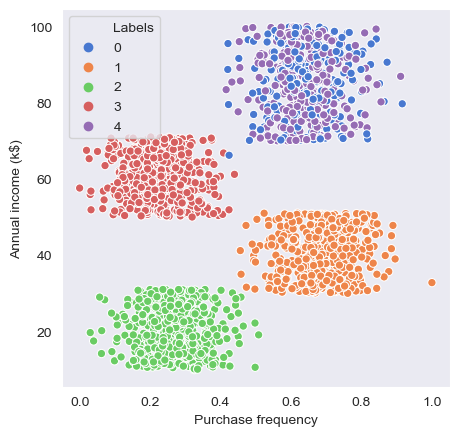

In [88]:
plt.figure(figsize = (5,5), dpi=100)
sns.scatterplot(fin['Purchase frequency'], fin['Annual income (k$)'], hue=fin['Labels'], palette='muted')
plt.show()

### Segment column

In [89]:
names = ['Young High-Earners', 'Frequent Low-Spenders', 'Non-Exposed Low-Spenders', 'Un-Frequent High-Spenders', 'Old High-Earners']
fin['Segment'] = fin['Labels'].replace(to_replace=[0,1,2,3,4], value=names)

In [90]:
fin.head()

,Country,Annual income (k$),Gender,Birth year,Is Parent,Purchase amount,Purchase frequency,# of different purchased product,Is earlier adopter,Preferred purchase channel,Has been reached by marketing,Best coupon type,Age,Labels,Segment
0,USA,16.9,M,1999,False,0.292497,0.347419,0.323232,False,online mobile,True,holidays,21.0,2,Non-Exposed Low-Spenders
1,Big 5 Europe,50.5,M,1964,True,0.757364,0.177353,0.505051,False,large store,True,holidays,56.0,3,Un-Frequent High-Spenders
2,USA,28.2,F,1999,False,0.266436,0.332183,0.252525,False,online mobile,False,no coupon,21.0,2,Non-Exposed Low-Spenders
3,USA,86.8,M,1958,True,0.887011,0.613946,0.878788,True,small store,True,new product,62.0,4,Old High-Earners
4,Big 5 Europe,30.5,F,1972,True,0.157081,0.727470,0.707071,True,large store,True,new product,48.0,1,Frequent Low-Spenders


In [91]:
fin.to_csv('ConsumerDataset_clustered.csv')

In [92]:
sales.head()

,date,qty,product
0,2000-01-01,0,Prod1
1,2000-01-01,0,Prod2
2,2000-01-01,0,Prod3
3,2000-01-01,0,Prod4
4,2000-02-01,30000,Prod1


In [93]:
sales.isna().sum()

date       0
qty        0
product    0
dtype: int64

In [94]:
describe_num(sales, 'qty')

qty
Minimum: 0
Mean: 1311250.0
Median: 1105000.0
Max: 3840000
Standard Deviation: 950411.29



In [95]:
describe_cat(sales, 'product')

product - 4 unique values.
dtype: object.
No missing values.

       Percentage %  Count
Prod3          25.0     30
Prod4          25.0     30
Prod1          25.0     30
Prod2          25.0     30



4
Skewness: 0.692, Kurtosis: -0.077


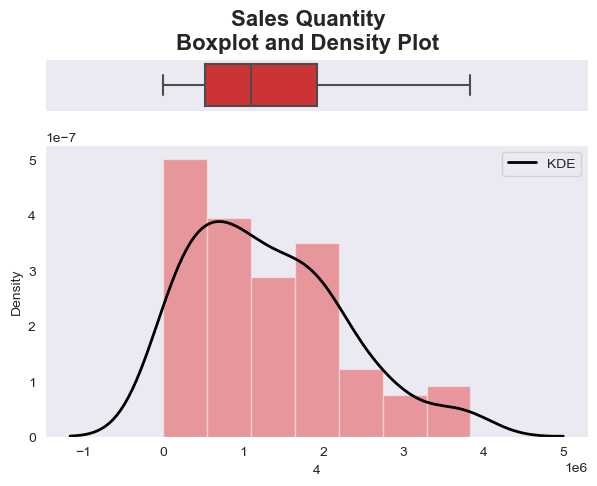

In [96]:
fig, axes = plt.subplots(2, sharex=True, figsize=(7, 5), dpi=100, gridspec_kw={"height_ratios": (.15, .85)})
fig.suptitle(f'Sales Quantity\nBoxplot and Density Plot', fontweight='bold', fontsize=16)
sns.boxplot(sales['qty'], ax=axes[0])
axes[0].set_title('')
axes[0].set_xlabel('')
axes[0].set_ylabel('')
sns.distplot(sales['qty'],
             kde_kws={"color": "black", "lw": 2, "label": "KDE"},
             hist_kws={"histtype": "bar", "linewidth": 1, "alpha": 0.4},
             ax=axes[1])
axes[1].set_title('')
axes[1].set_xlabel(f'{i}')
axes[1].set_ylabel('Density')
print(f"{i}\nSkewness: {skew(sales['qty']):0.3f}, Kurtosis: {kurtosis(sales['qty']):0.3f}")
plt.show()

In [97]:
sales = sales[['date', 'qty']]
sales['date'] = pd.to_datetime(sales['date'])
sales = sales.set_index('date')
sales.head()

,qty
date,
2000-01-01,0
2000-01-01,0
2000-01-01,0
2000-01-01,0
2000-02-01,30000


In [98]:
sns.set_style('whitegrid')

In [99]:
import matplotlib.dates as mdates

def plot_ts(timeseries, col=0, interval=7, rotation=0):
    '''
    Args:
        timeries (pandas.core.frame.DataFrame): Pandas df with index Date
    '''
    fig, ax = plt.subplots(figsize=(8, 4), dpi=100)
    ax.plot(timeseries.index, timeseries.iloc[:,col], linestyle='-', marker='')
    
    # Formatting xtick time labels
    days = mdates.DayLocator(interval=interval)
    days_format = mdates.DateFormatter('%b-%d-%Y')
    ax.xaxis.set_major_locator(days)
    ax.xaxis.set_major_formatter(days_format)
    plt.setp(ax.get_xticklabels(), rotation=rotation)
    
    ax.set_xlabel("Time", fontweight='bold')
    ax.set_ylabel("Sales", fontweight='bold')
    plt.title(f"{timeseries.iloc[:,col].name}", fontweight='bold')
    return plt.show()

def plot_rolling(timeseries, window=5, col=0, interval=7, rotation=0):
    '''
    Args:
        timeries (pandas.core.frame.DataFrame): Pandas df with index Date
        interval
    '''
    fig, ax = plt.subplots(figsize=(8, 4), dpi=100)
    ax.plot(timeseries.index, timeseries.iloc[:,col], linestyle='-', marker='', label='Original')
    
    # Calculating rolling stats
    rollmean = timeseries.rolling(window=window).mean()
    rollstd = timeseries.rolling(window=window).std()
    
    ax.plot(rollmean, linestyle='-', marker='', color='black', label='Rolling Mean')
    ax.plot(rollstd, linestyle='-', marker='', color='red', label='Rolling Std')
    
    # Formatting xtick time labels
    days = mdates.DayLocator(interval=interval)
    days_format = mdates.DateFormatter('%b-%d-%Y')
    ax.xaxis.set_major_locator(days)
    ax.xaxis.set_major_formatter(days_format)
    plt.setp(ax.get_xticklabels(), rotation=rotation)
    
    ax.set_xlabel("Time", fontweight='bold')
    ax.set_ylabel("Sales", fontweight='bold')
    plt.title(f"{timeseries.iloc[:,col].name}", fontweight='bold')
    plt.legend()
    return plt.show()

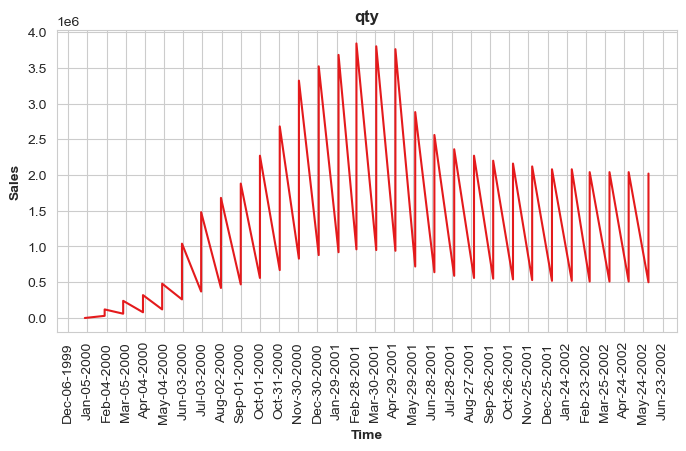

In [100]:
plot_ts(sales, interval=30, rotation=90)

In [101]:
max_mask = sales['qty'] == sales['qty'].max()
sales_max = sales[max_mask]
sales_max

,qty
date,
2001-03-01,3840000


1st March 2001 with 3.84 million units sold.

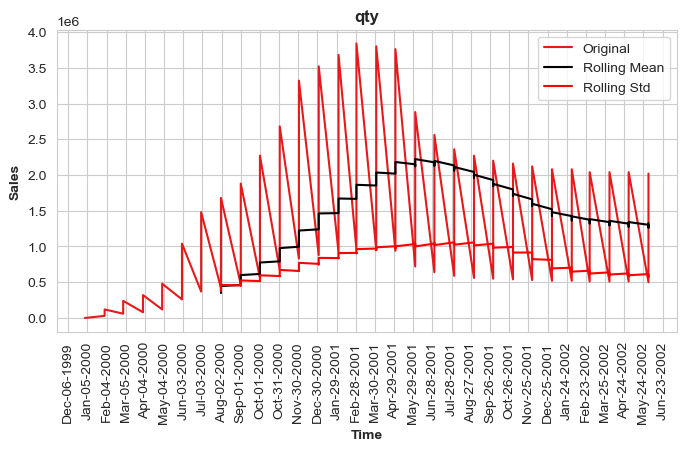

In [102]:
plot_rolling(sales, window=30, interval=30, rotation=90)

### Target Variable - Purchase Channel

In [103]:
describe_cat(fin, 'Preferred purchase channel')

Preferred purchase channel - 4 unique values.
dtype: object.
No missing values.

                Percentage %  Count
online desktop     34.517259    690
large store        25.862931    517
small store        24.162081    483
online mobile      15.457729    309



In [104]:
prep = fin.copy()
prep.drop('Labels', axis=1, inplace=True)
prep.head()

,Country,Annual income (k$),Gender,Birth year,Is Parent,Purchase amount,Purchase frequency,# of different purchased product,Is earlier adopter,Preferred purchase channel,Has been reached by marketing,Best coupon type,Age,Segment
0,USA,16.9,M,1999,False,0.292497,0.347419,0.323232,False,online mobile,True,holidays,21.0,Non-Exposed Low-Spenders
1,Big 5 Europe,50.5,M,1964,True,0.757364,0.177353,0.505051,False,large store,True,holidays,56.0,Un-Frequent High-Spenders
2,USA,28.2,F,1999,False,0.266436,0.332183,0.252525,False,online mobile,False,no coupon,21.0,Non-Exposed Low-Spenders
3,USA,86.8,M,1958,True,0.887011,0.613946,0.878788,True,small store,True,new product,62.0,Old High-Earners
4,Big 5 Europe,30.5,F,1972,True,0.157081,0.727470,0.707071,True,large store,True,new product,48.0,Frequent Low-Spenders


In [105]:
prep['Preferred purchase channel'].replace(to_replace=['online desktop', 'online mobile'], value='Online', inplace=True)
prep['Preferred purchase channel'].replace(to_replace=['small store', 'large store'], value='Store', inplace=True)
describe_cat(prep, 'Preferred purchase channel')

Preferred purchase channel - 2 unique values.
dtype: object.
No missing values.

        Percentage %  Count
Store      50.025013   1000
Online     49.974987    999



No need for oversampling or undersampling, the classes are balanced.

In [106]:
cat_prep = prep[['Gender', 'Is Parent', 'Is earlier adopter', 'Preferred purchase channel', 'Has been reached by marketing', 'Best coupon type', 'Segment']]
cat_prep_dummies = pd.get_dummies(cat_prep, drop_first=True)
cat_prep_dummies.head()

,Is Parent,Is earlier adopter,Has been reached by marketing,Gender_M,Preferred purchase channel_Store,Best coupon type_holidays,Best coupon type_new product,Best coupon type_no coupon,Best coupon type_promotional event invitation,Best coupon type_special season,Segment_Non-Exposed Low-Spenders,Segment_Old High-Earners,Segment_Un-Frequent High-Spenders,Segment_Young High-Earners
0,False,False,True,1,0,1,0,0,0,0,1,0,0,0
1,True,False,True,1,1,1,0,0,0,0,0,0,1,0
2,False,False,False,0,0,0,0,1,0,0,1,0,0,0
3,True,True,True,1,1,0,1,0,0,0,0,1,0,0
4,True,True,True,0,1,0,1,0,0,0,0,0,0,0


In [107]:
X = pd.concat([scaled_df, cat_prep_dummies], axis=1)
X.head()

,Annual income (k$)_scaled,Purchase amount_scaled,Purchase frequency_scaled,# of different purchased product_scaled,Age_scaled,Is Parent,Is earlier adopter,Has been reached by marketing,Gender_M,Preferred purchase channel_Store,Best coupon type_holidays,Best coupon type_new product,Best coupon type_no coupon,Best coupon type_promotional event invitation,Best coupon type_special season,Segment_Non-Exposed Low-Spenders,Segment_Old High-Earners,Segment_Un-Frequent High-Spenders,Segment_Young High-Earners
0,-1.391952,-0.950836,-0.476430,-0.826213,-1.574632,False,False,True,1,0,1,0,0,0,0,1,0,0,0
1,-0.054146,1.035168,-1.232481,-0.145422,0.783137,True,False,True,1,1,1,0,0,0,0,0,0,1,0
2,-0.942035,-1.062173,-0.544163,-1.090965,-1.574632,False,False,False,0,0,0,0,1,0,0,1,0,0,0
3,1.391161,1.589046,0.708446,1.253982,1.187326,True,True,True,1,1,0,1,0,0,0,0,1,0,0
4,-0.850459,-1.529358,1.213132,0.611013,0.244219,True,True,True,0,1,0,1,0,0,0,0,0,0,0


In [108]:
y = X[['Preferred purchase channel_Store']]
X.drop('Preferred purchase channel_Store', axis=1, inplace=True)

In [109]:
X.columns

Index(['Annual income (k$)_scaled', 'Purchase amount_scaled',
       'Purchase frequency_scaled', '# of different purchased product_scaled',
       'Age_scaled', 'Is Parent', 'Is earlier adopter',
       'Has been reached by marketing', 'Gender_M',
       'Best coupon type_holidays', 'Best coupon type_new product',
       'Best coupon type_no coupon',
       'Best coupon type_promotional event invitation',
       'Best coupon type_special season', 'Segment_Non-Exposed Low-Spenders',
       'Segment_Old High-Earners', 'Segment_Un-Frequent High-Spenders',
       'Segment_Young High-Earners'],
      dtype='object')

In [110]:
y.head()

,Preferred purchase channel_Store
0,0
1,1
2,0
3,1
4,1


In [111]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.30, 
                                                    stratify = y,
                                                    random_state = 42)

print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}, y_test shape: {y_test.shape}")

X_train shape: (1399, 18), X_test shape: (600, 18)
y_train shape: (1399, 1), y_test shape: (600, 1)


In [112]:
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score, f1_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV



classifierTree = DecisionTreeClassifier()
parametersTree = {'criterion': ['entropy','gini'], # Entropy is informatin gain criterion
              'max_depth': np.arange(5,15),
              'min_samples_split': [5,10],
              'min_samples_leaf': [2]}

gs = GridSearchCV(classifierTree, parametersTree, cv=10, scoring = 'f1', verbose=10, n_jobs=-1, refit=True)

In [113]:
gs = gs.fit(X_train, y_train)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1872s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0647s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0909s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 208 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 312 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 352 out of 400 | elapsed:    5.5s remaining:    0.7s
[Parallel(n_jobs=-1)]: Done 400 out 

In [114]:
print(f"TRAIN f1:{gs.best_score_:0.5f}, using {gs.best_params_}")

TRAIN f1:0.99152, using {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10}


In [115]:
best_model = gs.best_estimator_
y_pred = best_model.predict(X_test)

In [116]:
print(f"TEST f1: {metrics.f1_score(y_test, y_pred)}")

TEST f1: 0.9915966386554621


In [117]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       300
           1       1.00      0.98      0.99       300

    accuracy                           0.99       600
   macro avg       0.99      0.99      0.99       600
weighted avg       0.99      0.99      0.99       600



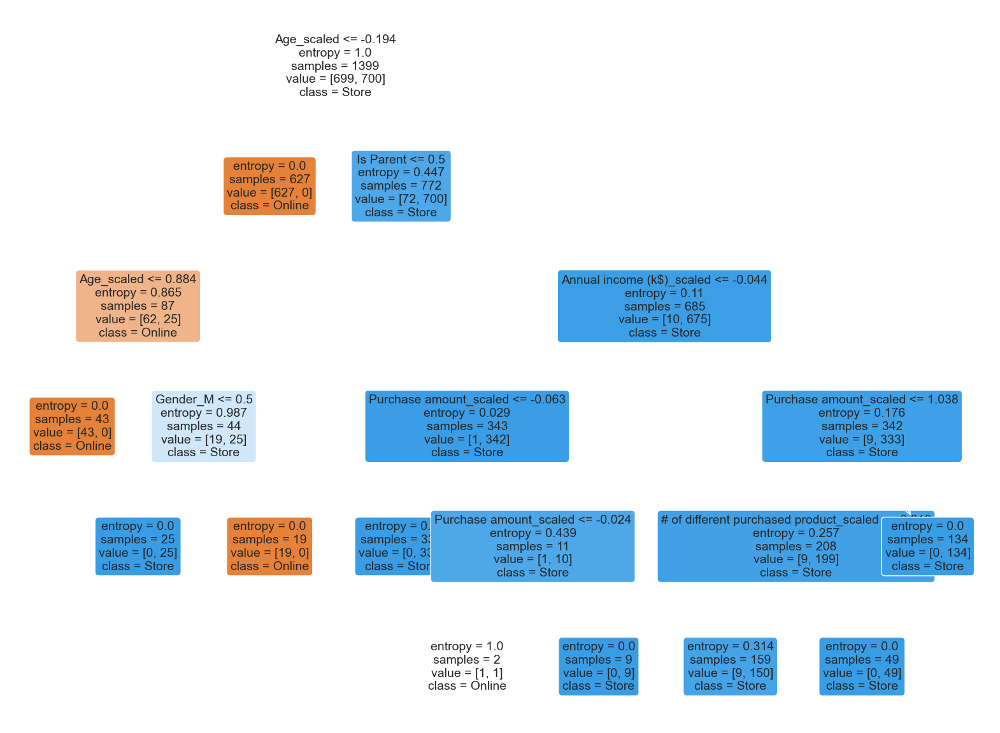

In [118]:
from sklearn.tree import plot_tree
fig, ax = plt.subplots(figsize=(20, 15), dpi=100)
a = plot_tree(best_model, 
              feature_names=X_test.columns, 
              class_names=['Online', 'Store'],
              filled=True, 
              rounded=True, 
              fontsize=14)

In [119]:
from sklearn import tree
r = tree.export_text(best_model,feature_names=[*X_test.columns])
print(r)

|--- Age_scaled <= -0.19
|   |--- class: 0
|--- Age_scaled >  -0.19
|   |--- Is Parent <= 0.50
|   |   |--- Age_scaled <= 0.88
|   |   |   |--- class: 0
|   |   |--- Age_scaled >  0.88
|   |   |   |--- Gender_M <= 0.50
|   |   |   |   |--- class: 1
|   |   |   |--- Gender_M >  0.50
|   |   |   |   |--- class: 0
|   |--- Is Parent >  0.50
|   |   |--- Annual income (k$)_scaled <= -0.04
|   |   |   |--- Purchase amount_scaled <= -0.06
|   |   |   |   |--- class: 1
|   |   |   |--- Purchase amount_scaled >  -0.06
|   |   |   |   |--- Purchase amount_scaled <= -0.02
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- Purchase amount_scaled >  -0.02
|   |   |   |   |   |--- class: 1
|   |   |--- Annual income (k$)_scaled >  -0.04
|   |   |   |--- Purchase amount_scaled <= 1.04
|   |   |   |   |--- # of different purchased product_scaled <= 0.82
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- # of different purchased product_scaled >  0.82
|   |   |   |   |   |--- class: 1
|   |   